<a href="https://colab.research.google.com/github/Eylz-Liu/ALM-study/blob/main/Etude_GSE_Output_PVFP_2025-2034_V2511.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Section 1 - Importation de tirage


In [80]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans

# Définir les bornes de colonnes
col_start = 2   # [ 2025(1) - 2034(10) ]  [ 2025(11) - 2044(20) ]
col_end   = 11  # correspond à la colonne 11

1.1 Extraction de GSE Taux *court* Yearly


In [81]:
# Étape 1 : Uploader le fichier Excel depuis ton ordinateur
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx

# Remplace par le nom exact du fichier uploadé
filename = "TIRAGES_TXCOURT_Y.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name=0, header=None)

# Étape 3 : Extraire les strikes (première ligne, hors première colonne)
# maturities = df.iloc[0, 1:].astype(float).values # .str.replace('%', '').astype(float).values
maturities = df.iloc[0, col_start:col_end+1].astype(float).values

# Étape 4 : Extraire les maturités (première colonne, hors première ligne)
scenario = df.iloc[1:, 0].astype(float).values
print("T_array (maturities):", maturities.shape)

# Étape 5 : Extraire la matrice IV (le reste du tableau)
# TL_matrix = df.iloc[1:, 1:].astype(float).values

# Extraire uniquement les colonnes entre 2 et 11
TL_matrix = df.iloc[1:, col_start:col_end+1].astype(float).values

# Étape 6 : Afficher les résultats
#print("scenario:", scenario)
print("Maturities (years):", maturities)
print("TL Matrix shape:", TL_matrix.shape)
print("TL Matrix (extrait):\n", TL_matrix[:5, :7])  # Affiche un extrait

Saving TIRAGES_TXCOURT_Y.xlsx to TIRAGES_TXCOURT_Y (7).xlsx
T_array (maturities): (10,)
Maturities (years): [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
TL Matrix shape: (1000, 10)
TL Matrix (extrait):
 [[0.04132304 0.04553993 0.02755292 0.01473777 0.01002518 0.01163666
  0.0217865 ]
 [0.00696715 0.00398873 0.01888655 0.03269351 0.04046442 0.03983933
  0.02731015]
 [0.0192707  0.01167816 0.00756667 0.00883847 0.01948922 0.01400606
  0.01554458]
 [0.02490723 0.03338901 0.04304006 0.04112793 0.02799685 0.03645493
  0.03473258]
 [0.01238482 0.00752674 0.01123586 0.0152697  0.0229885  0.02645372
  0.020237  ]]


 extraction Taux long Tirage

In [82]:
# Étape 1 : ********* Taux Long Yearly **************************************
# ***********************************************************************
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx

# Remplace par le nom exact du fichier uploadé
filename = "TIRAGES_TXLONG_Y.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name=0, header=None)

# Étape 3 : Extraire les strikes (première ligne, hors première colonne)
# maturities = df.iloc[0, 1:].astype(float).values # .str.replace('%', '').astype(float).values
maturities = df.iloc[0, col_start:col_end+1].astype(float).values

# Étape 4 : Extraire les maturités (première colonne, hors première ligne)
scenario = df.iloc[1:, 0].astype(float).values
print("T_array (maturities):", maturities.shape)

# Étape 5 : Extraire la matrice IV (le reste du tableau)
#TLT_matrix = df.iloc[1:, 1:].astype(float).values

# Extraire uniquement les colonnes entre 2 et 11
TLT_matrix = df.iloc[1:, col_start:col_end+1].astype(float).values

# Étape 6 : Afficher les résultats
#print("scenario:", scenario)
print("Maturities (years):", maturities)
print("TLT Matrix shape:", TLT_matrix.shape)
print("TLT Matrix (extrait):\n", TLT_matrix[:5, :7])  # Affiche un extrait

Saving TIRAGES_TXLONG_Y.xlsx to TIRAGES_TXLONG_Y (3).xlsx
T_array (maturities): (10,)
Maturities (years): [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
TLT Matrix shape: (1000, 10)
TLT Matrix (extrait):
 [[0.03097075 0.03394734 0.03146827 0.0278616  0.02064993 0.02682506
  0.02051069]
 [0.01986689 0.018398   0.02064449 0.0248214  0.03306923 0.02625613
  0.03241482]
 [0.01993678 0.02234273 0.02331865 0.01983167 0.01821649 0.02104267
  0.02128728]
 [0.03029036 0.02885652 0.02903714 0.03340042 0.03545674 0.03227611
  0.03161879]
 [0.01386565 0.01844111 0.02399018 0.02519239 0.01959118 0.01083871
  0.01246886]]


Extraction Tirage Action transformé en %

In [83]:
# Étape 1 : ********* ACTION Yearly **************************************
# ***********************************************************************
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx

# Remplace par le nom exact du fichier uploadé
filename = "TIRAGES_INDACT_Y6.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name="V2", header=None)

# Étape 3 : Extraire les strikes (première ligne, hors première colonne)
#maturities = df.iloc[0, 1:].astype(float).values # .str.replace('%', '').astype(float).values

maturities = df.iloc[0, col_start:col_end+1].astype(float).values

# Étape 4 : Extraire les maturités (première colonne, hors première ligne)
scenario = df.iloc[1:, 0].astype(float).values
print("T_array (maturities - indice action):", maturities.shape)

# Étape 5 : Extraire la matrice IV (le reste du tableau)
#ACT_matrix = df.iloc[1:, 1:].astype(float).values

# Extraire uniquement les colonnes entre 2 et 11
ACT_matrix = df.iloc[1:, col_start:col_end+1].astype(float).values

# Étape 6 : Afficher les résultats
#print("scenario:", scenario)
print("Maturities (years) - indice action:", maturities)
print("TL Matrix shape - indice action:", TL_matrix.shape)
print("TL Matrix (extrait) - indice action:\n", TL_matrix[:5, :7])  # Affiche un extrait

Saving TIRAGES_INDACT_Y6.xlsx to TIRAGES_INDACT_Y6 (3).xlsx
T_array (maturities - indice action): (10,)
Maturities (years) - indice action: [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
TL Matrix shape - indice action: (1000, 10)
TL Matrix (extrait) - indice action:
 [[0.04132304 0.04553993 0.02755292 0.01473777 0.01002518 0.01163666
  0.0217865 ]
 [0.00696715 0.00398873 0.01888655 0.03269351 0.04046442 0.03983933
  0.02731015]
 [0.0192707  0.01167816 0.00756667 0.00883847 0.01948922 0.01400606
  0.01554458]
 [0.02490723 0.03338901 0.04304006 0.04112793 0.02799685 0.03645493
  0.03473258]
 [0.01238482 0.00752674 0.01123586 0.0152697  0.0229885  0.02645372
  0.020237  ]]


Extraction IMMO transformé en %

In [84]:
# Étape 1 : ********* Indice IMMO Yearly **************************************
# ***********************************************************************
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx

# Remplace par le nom exact du fichier uploadé
filename = "TIRAGES_INDIMMO_Y2.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name="V2", header=None)

# Étape 3 : Extraire les strikes (première ligne, hors première colonne)

# maturities = df.iloc[0, 1:].astype(float).values # .str.replace('%', '').astype(float).values
maturities = df.iloc[0, col_start:col_end+1].astype(float).values

# Étape 4 : Extraire les maturités (première colonne, hors première ligne)
scenario = df.iloc[1:, 0].astype(float).values
print("T_array (maturities) - indice immo:", maturities.shape)

# Étape 5 : Extraire la matrice IV (le reste du tableau)
#IMMO_matrix = df.iloc[1:, 1:].astype(float).values

# Extraire uniquement les colonnes entre 2 et 11
IMMO_matrix = df.iloc[1:, col_start:col_end+1].astype(float).values

# Étape 6 : Afficher les résultats
#print("scenario:", scenario)
print("Maturities (years) - indice immo:", maturities)
print("TLT Matrix shape - indice immo:", TLT_matrix.shape)
print("TLT Matrix (extrait) - indice immo:\n", TLT_matrix[:5, :7])  # Affiche un extrait

Saving TIRAGES_INDIMMO_Y2.xlsx to TIRAGES_INDIMMO_Y2 (3).xlsx
T_array (maturities) - indice immo: (10,)
Maturities (years) - indice immo: [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
TLT Matrix shape - indice immo: (1000, 10)
TLT Matrix (extrait) - indice immo:
 [[0.03097075 0.03394734 0.03146827 0.0278616  0.02064993 0.02682506
  0.02051069]
 [0.01986689 0.018398   0.02064449 0.0248214  0.03306923 0.02625613
  0.03241482]
 [0.01993678 0.02234273 0.02331865 0.01983167 0.01821649 0.02104267
  0.02128728]
 [0.03029036 0.02885652 0.02903714 0.03340042 0.03545674 0.03227611
  0.03161879]
 [0.01386565 0.01844111 0.02399018 0.02519239 0.01959118 0.01083871
  0.01246886]]


Extraction de resultat finanicer analytique

In [85]:
# Étape 1 : ********* resultat financier analytique Yearly **************************************
# ***********************************************************************
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx

# Remplace par le nom exact du fichier uploadé
filename = "RES_RFA_Y.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name=0, header=None)

# Étape 3 : Extraire les strikes (première ligne, hors première colonne)

# maturities = df.iloc[0, 1:].astype(float).values # .str.replace('%', '').astype(float).values
maturities = df.iloc[0, col_start:col_end+1].astype(float).values

# Étape 4 : Extraire les maturités (première colonne, hors première ligne)
scenario = df.iloc[1:, 0].astype(float).values
print("T_array (maturities):", maturities.shape)

# Étape 5 : Extraire la matrice IV (le reste du tableau)
# RFA_matrix = df.iloc[1:, 1:].astype(float).values

# Extraire uniquement les colonnes entre 2 et 11
RFA_matrix = df.iloc[1:, col_start:col_end+1].astype(float).values

# Étape 6 : Afficher les résultats
#print("scenario:", scenario)
print("Maturities (years)- resultat financier analytique:", maturities)
print("RFA Matrix shape - resultat financier analytique:", RFA_matrix.shape)
print("RFA Matrix (extrait) - resultat financier analytique:\n", RFA_matrix)  # Affiche un extrait

Saving RES_RFA_Y.xlsx to RES_RFA_Y (5).xlsx
T_array (maturities): (10,)
Maturities (years)- resultat financier analytique: [ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]
RFA Matrix shape - resultat financier analytique: (1000, 10)
RFA Matrix (extrait) - resultat financier analytique:
 [[ 20814.21   28460.072  14051.089 ...  14335.403 -74409.272  -3169.789]
 [ 22719.336  39073.312  64264.38  ...  49191.876 123310.016  86605.336]
 [ 22757.2    31731.636  47236.996 ...  20347.858  25004.106   7675.252]
 ...
 [ 22108.462  30182.036  27750.202 ...  -7525.809   2926.992  -5697.871]
 [ 20660.564  29847.93   20392.334 ...   7870.221  12730.343  -3001.68 ]
 [ 23907.436  47318.428  39904.552 ...  73076.776  52107.448  51973.444]]


Extraction des output BE&PVFFP des 1000 scénarios

In [ ]:
# Étape 1 : ********* Output BE PVFP **************************************
# ***********************************************************************
from google.colab import files
uploaded = files.upload()  # Choisis le fichier SXE5 OVDV 1211.xlsx

# Remplace par le nom exact du fichier uploadé
filename = "BE_PVFP.xlsx"

# Lire la 2e feuille (index 1) sans en-tête
df = pd.read_excel(filename, sheet_name="V2", header=None)
df = df.iloc[1:].reset_index(drop=True)

# Vérifier la structure
print("Shape du fichier :", df.shape)
print("Aperçu des premières lignes :\n", df.head())

# Extraire les colonnes BE et PVFP
be_array = df.iloc[:, 1].values       # 2e colonne → BE
pvfp_array = df.iloc[:, 2].values     # 3e colonne → PVFP

# Optionnel : convertir en DataFrames séparés
be_df = pd.DataFrame(be_array, columns=["BE"])
pvfp_df = pd.DataFrame(pvfp_array, columns=["PVFP"])


Saving BE_PVFP.xlsx to BE_PVFP.xlsx
Shape du fichier : (1000, 3)
Aperçu des premières lignes :
    0             1            2
0  1  10575371.264    414908.64
1  2  14082946.048      1583008
2  3  11811144.704   513327.008
3  4   12618593.28  1386158.336
4  5  12981169.152   997441.344


In [ ]:
# Affichage
print("BE (array):", be_array[:5])
print("PVFP (array):", pvfp_array[:5])

# Affichage complet des DataFrames
print("BE DataFrame :\n", be_df)
print("PVFP DataFrame :\n", pvfp_df)

BE (array): [10575371.264 14082946.048 11811144.704 12618593.28 12981169.152]
PVFP (array): [414908.64 1583008 513327.008 1386158.336 997441.344]
BE DataFrame :
                BE
0    10575371.264
1    14082946.048
2    11811144.704
3     12618593.28
4    12981169.152
..            ...
995  10347578.368
996   10410808.32
997  12838995.968
998  11640549.376
999  11731661.824

[1000 rows x 1 columns]
PVFP DataFrame :
             PVFP
0      414908.64
1        1583008
2     513327.008
3    1386158.336
4     997441.344
..           ...
995   888557.248
996  1019376.576
997   102227.272
998   703375.296
999   962644.352

[1000 rows x 1 columns]


Extraction de 4 hypothèses et Y explicative pour une année donnée

In [86]:
import numpy as np

def prepare_year_data(year_index, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, RES_RFA):

    # Extraire les colonnes correspondant à l'année
    X = np.column_stack([
        TL_matrix[:, year_index],
        TLT_matrix[:, year_index],
        ACT_matrix[:, year_index],
        IMMO_matrix[:, year_index]
    ])

    # Variable cible
    y = RES_RFA[:, year_index]

    return X, y

In [87]:
# Supposons qu'on veuille l'année 5 (index 4 car Python commence à 0)
hypo, RFA = prepare_year_data(1, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, RFA_matrix)

print("Shape X :", hypo.shape)  # (1000, 4)
print("Shape y :", RFA.shape)  # (1000,)
print("Extrait X:\n", hypo[:5])
print("Extrait y:\n", RFA[:5])

Shape X : (1000, 4)
Shape y : (1000,)
Extrait X:
 [[ 0.04553993  0.03394734 -0.21990373 -0.02375525]
 [ 0.00398873  0.018398    0.24070115  0.06107239]
 [ 0.01167816  0.02234273 -0.14742283  0.02333357]
 [ 0.03338901  0.02885652  0.13259979  0.00958094]
 [ 0.00752674  0.01844111  0.01287816 -0.0524832 ]]
Extrait y:
 [28460.072 39073.312 31731.636 40495.22  44898.224]


# Section 2 - étude statistique exploratoire

Fonction de plot 1000 trajectoires

In [30]:


def plot_scenario_trajectories(TL_matrix, maturities, plot_title):
    """
    Affiche les trajectoires de taux simulés avec la moyenne en surbrillance et annotations.

    Parameters:
    - TL_matrix : np.ndarray, shape (n_scenarios, n_years)
    - maturities : array-like, les années correspondantes
    - plot_title : str, titre du graphique
    """
    plt.figure(figsize=(14, 7))

    # Tracer tous les scénarios
    for i in range(TL_matrix.shape[0]):
        plt.plot(maturities, TL_matrix[i, :], color='gray', alpha=0.1)

    # Moyenne par année
    mean_by_year = TL_matrix.mean(axis=0)
    plt.plot(maturities, mean_by_year, color='pink', linewidth=2, label='Moyenne')

    # Points annotés
    indices_to_annotate = [0, 10, 20, 30, 39]
    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_by_year[idx]
            plt.scatter(x, y, color='pink', zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='pink')

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("Années", fontsize=12)
    plt.ylabel("Taux", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()


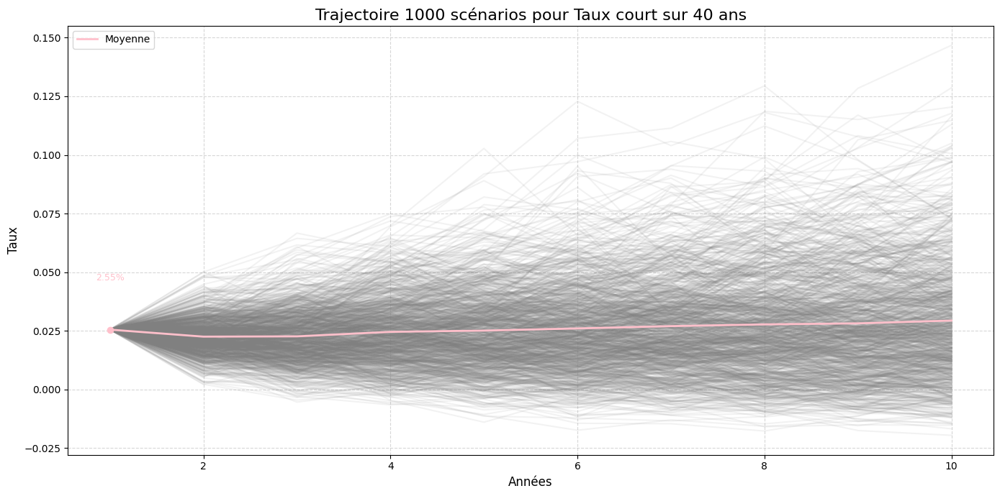

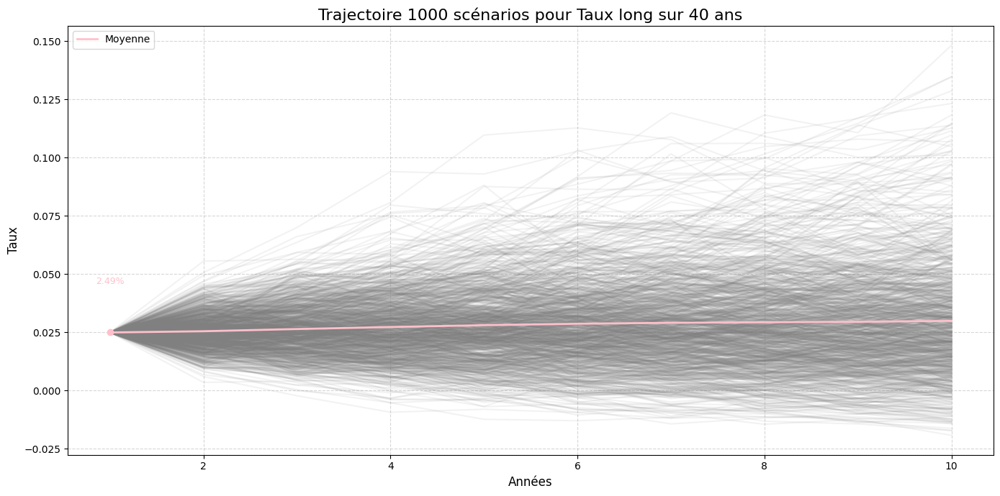

In [31]:
plot_scenario_trajectories(TL_matrix, maturities, "Trajectoire 1000 scénarios pour Taux court sur 40 ans")
plot_scenario_trajectories(TLT_matrix, maturities, "Trajectoire 1000 scénarios pour Taux long sur 40 ans")

Fonction de plot trajectoire positive & négative

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def plot_positive_negative_trajectories(TL_matrix, maturities):
    """
    Sépare et trace les trajectoires positives et négatives selon la moyenne par scénario.

    Parameters:
    - TL_matrix : np.ndarray, shape (n_scenarios, n_years)
    - maturities : array-like, les années correspondantes
    """
    # Séparation des scénarios
    mean_by_scenario = TL_matrix.mean(axis=1)
    positive_indices = np.where(mean_by_scenario > 0)[0]
    negative_indices = np.where(mean_by_scenario < 0)[0]

    TL_positive = TL_matrix[positive_indices, :]
    TL_negative = TL_matrix[negative_indices, :]

    # Choix des années à annoter
    indices_to_annotate = [0, 10, 20, 30, 39]

    # 📈 Groupe 1 : Trajectoires positives
    plt.figure(figsize=(12, 6))
    for i in range(TL_positive.shape[0]):
        plt.plot(maturities, TL_positive[i, :], color='lightgreen', alpha=0.05)

    mean_pos = TL_positive.mean(axis=0)
    plt.plot(maturities, mean_pos, color='yellow', linewidth=2, label='Moyenne (positive)')

    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_pos[idx]
            plt.scatter(x, y, color='yellow', zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='yellow')

    plt.title(f"Trajectoires positives ({len(positive_indices)} scénarios)", fontsize=16)
    plt.xlabel("Années")
    plt.ylabel("Taux")
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 📉 Groupe 2 : Trajectoires négatives
    plt.figure(figsize=(12, 6))
    for i in range(TL_negative.shape[0]):
        plt.plot(maturities, TL_negative[i, :], color='red', alpha=0.05)

    mean_neg = TL_negative.mean(axis=0)
    plt.plot(maturities, mean_neg, color='blue', linewidth=2, label='Moyenne (négative)')

    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]
            y = mean_neg[idx]
            plt.scatter(x, y, color='blue', zorder=5)
            plt.text(x, y + 0.02, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='blue')

    plt.title(f"Trajectoires négatives ({len(negative_indices)} scénarios)", fontsize=16)
    plt.xlabel("Années")
    plt.ylabel("Taux")
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

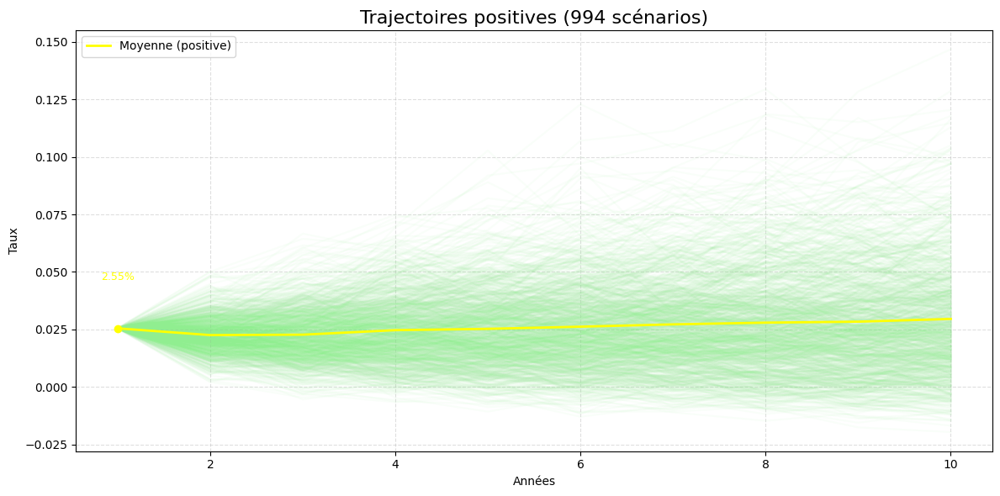

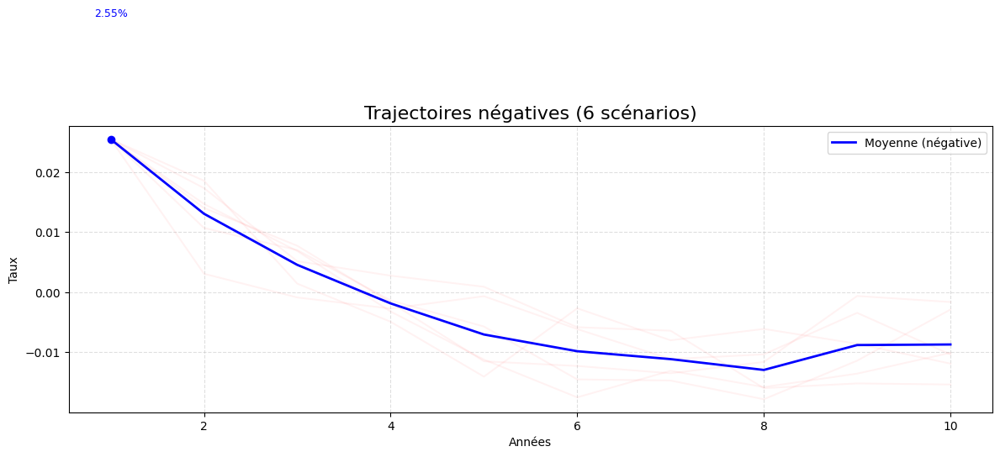

In [33]:
plot_positive_negative_trajectories(TL_matrix, maturities)

1.2 Statistiques descriptives par année ( par colonnes) sur les 1000 scnéarios

In [34]:
import numpy as np
import matplotlib.pyplot as plt

def plot_yearly_statistics(TL_matrix, maturities, plot_titre):
    """
    Trace les statistiques par année : moyenne, médiane, min, max, ±1 écart-type.

    Parameters:
    - TL_matrix : np.ndarray, shape (n_scenarios, n_years)
    - maturities : array-like, les années correspondantes
    - plot_titre : str, titre du graphique
    """
    # Calcul des statistiques
    mean_by_year = np.mean(TL_matrix, axis=0)
    median_by_year = np.median(TL_matrix, axis=0)
    std_by_year = np.std(TL_matrix, axis=0)
    min_by_year = np.min(TL_matrix, axis=0)
    max_by_year = np.max(TL_matrix, axis=0)

    # Indices à annoter
    indices_to_annotate = [0, 10, 20, 30, 39]

    plt.figure(figsize=(12, 6))

    # Tracer les courbes principales
    plt.plot(maturities, mean_by_year, label='Moyenne', color='blue', linewidth=2)
    plt.plot(maturities, median_by_year, label='Médiane', color='green', linestyle='--')
    plt.plot(maturities, min_by_year, label='Min', color='red', linestyle=':')
    plt.plot(maturities, max_by_year, label='Max', color='orange', linestyle=':')

    # Zone ±1 écart-type
    plt.fill_between(maturities,
                     mean_by_year - std_by_year,
                     mean_by_year + std_by_year,
                     alpha=0.2, label='Moyenne ±1σ', color='lightblue')

    # Points annotés
    for idx in indices_to_annotate:
        if idx < len(maturities):
            x = maturities[idx]

            y_mean = mean_by_year[idx]
            plt.scatter(x, y_mean, color='blue', zorder=5)
            plt.text(x, y_mean + 0.005, f"{y_mean*100:.2f}%", fontsize=9, ha='center', va='bottom', color='blue')

            y_median = median_by_year[idx]
            plt.scatter(x, y_median, color='green', zorder=5)
            plt.text(x, y_median + 0.005, f"{y_median*100:.2f}%", fontsize=9, ha='center', va='bottom', color='green')

            y_min = min_by_year[idx]
            plt.scatter(x, y_min, color='red', zorder=5)
            plt.text(x, y_min + 0.005, f"{y_min*100:.2f}%", fontsize=9, ha='center', va='bottom', color='red')

            y_max = max_by_year[idx]
            plt.scatter(x, y_max, color='orange', zorder=5)
            plt.text(x, y_max + 0.005, f"{y_max*100:.2f}%", fontsize=9, ha='center', va='bottom', color='orange')

    # Personnalisation
    plt.title(plot_titre, fontsize=16)
    plt.xlabel("Années", fontsize=12)
    plt.ylabel("Taux", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

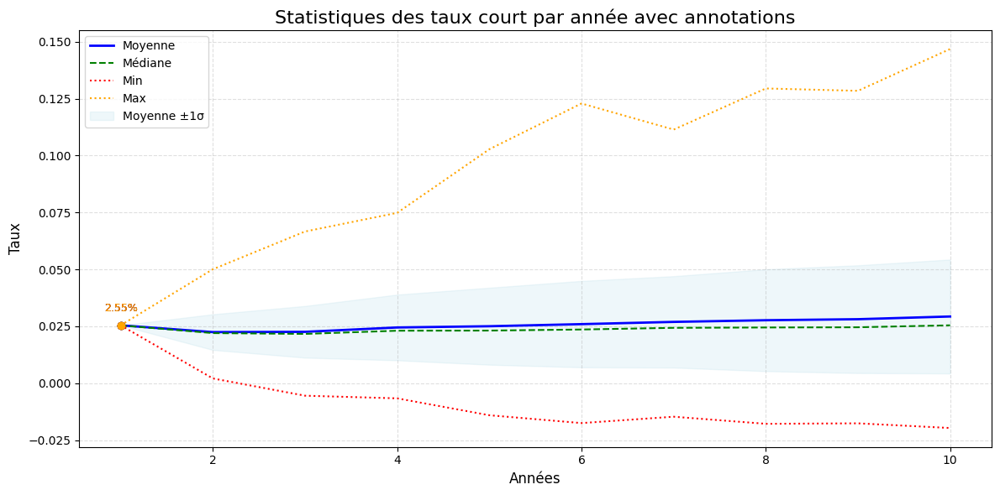

In [35]:
plot_yearly_statistics(TL_matrix, maturities, "Statistiques des taux court par année avec annotations")

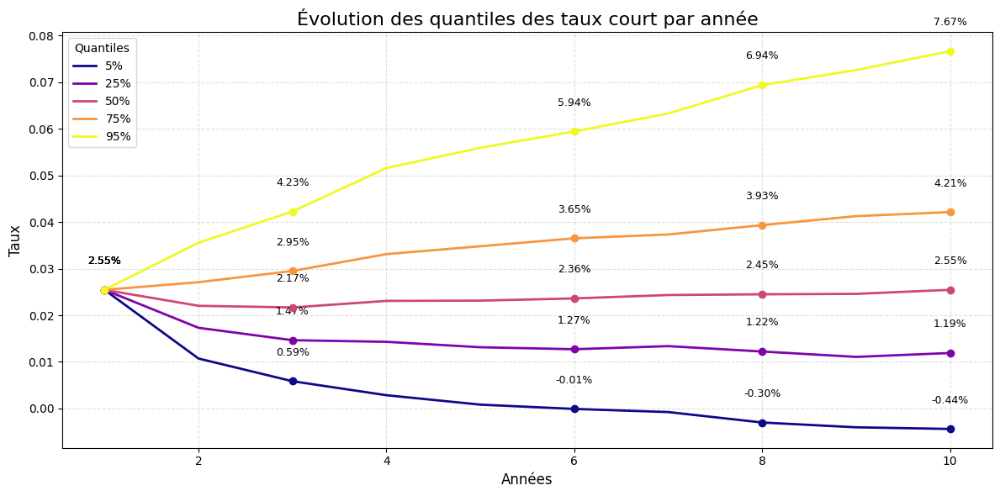

In [38]:

#*******************************************************************
# 1.2.2 - Quantile sur 1000 scénarios par année
#*******************************************************************
# Définir les niveaux de quantiles
quantile_levels = [0.05, 0.25, 0.5, 0.75, 0.95]

# Créer un DataFrame pour stocker les quantiles
quantile_df = pd.DataFrame(index=quantile_levels, columns=maturities)

# Calculer les quantiles pour chaque année
for i, year in enumerate(maturities):
    quantile_df[year] = np.quantile(TL_matrix[:, i], quantile_levels)

# Choisir les indices d'années à annoter (ex : début, milieu, fin)
indices_to_annotate = [0, 2, 5, 7, 9]

# Tracer les courbes de quantiles
plt.figure(figsize=(12, 6))
colors = plt.cm.plasma(np.linspace(0, 1, len(quantile_levels)))

for i, q in enumerate(quantile_levels):
    y_values = quantile_df.loc[q]
    plt.plot(maturities, y_values, label=f"{int(q*100)}%", color=colors[i], linewidth=2)

    # Ajouter des points annotés
    for idx in indices_to_annotate:
        x = maturities[idx]
        y = y_values.iloc[idx]
        plt.scatter(x, y, color=colors[i], zorder=5)
        plt.text(x, y + 0.005, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='black')

# Personnalisation
plt.title("Évolution des quantiles des taux court par année", fontsize=16)
plt.xlabel("Années", fontsize=12)
plt.ylabel("Taux", fontsize=12)
plt.legend(title="Quantiles")
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


1.3 Analyse par scénario / par ligne sur 40ans de projection

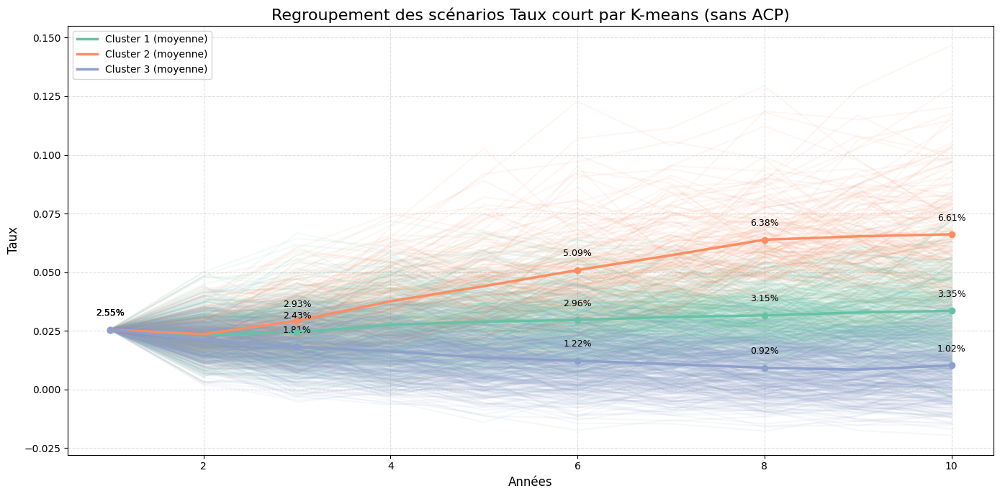

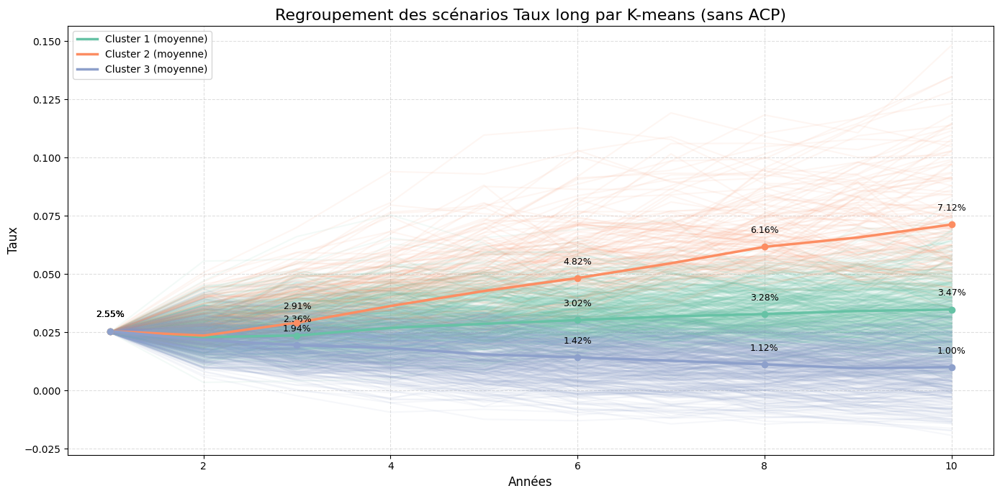

In [40]:
# ****************************************************************** Tuax court ******* axis = 0, par ligne/par scénario **************************************************
# Étape 1 : Appliquer K-means sur les scénarios
k = 3  # nombre de groupes à ajuster selon ton besoin
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(TL_matrix)

# Étape 2 : Visualiser les scénarios regroupés
plt.figure(figsize=(14, 7))
palette = sns.color_palette("Set2", k)

for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    for i in cluster_indices:
        plt.plot(maturities, TL_matrix[i, :], color=palette[cluster], alpha=0.08)

# Ajouter les moyennes de chaque cluster
for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    cluster_mean = TL_matrix[cluster_indices].mean(axis=0)
    plt.plot(maturities, cluster_mean, color=palette[cluster], linewidth=2.5, label=f'Cluster {cluster+1} (moyenne)')

    # Choisir les années à annoter (ex : tous les 10 ans)
    indices_to_annotate = [0, 2, 5, 7, 9]

    for idx in indices_to_annotate:
        x = maturities[idx]
        y = cluster_mean[idx]
        plt.scatter(x, y, color=palette[cluster], zorder=5)
        plt.text(x, y+0.005, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='black')

# Personnalisation
plt.title("Regroupement des scénarios Taux court par K-means (sans ACP)", fontsize=16)
plt.xlabel("Années", fontsize=12)
plt.ylabel("Taux", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


# ****************************************************************** Tuax long ******* axis = 0, par ligne/par scénario **************************************************
# Étape 1 : Appliquer K-means sur les scénarios
k = 3  # nombre de groupes à ajuster selon ton besoin
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(TLT_matrix)

# Étape 2 : Visualiser les scénarios regroupés
plt.figure(figsize=(14, 7))
palette = sns.color_palette("Set2", k)

for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    for i in cluster_indices:
        plt.plot(maturities, TLT_matrix[i, :], color=palette[cluster], alpha=0.08)

# Ajouter les moyennes de chaque cluster
for cluster in range(k):
    cluster_indices = np.where(labels == cluster)[0]
    cluster_mean = TL_matrix[cluster_indices].mean(axis=0)
    plt.plot(maturities, cluster_mean, color=palette[cluster], linewidth=2.5, label=f'Cluster {cluster+1} (moyenne)')

    for idx in indices_to_annotate:
        x = maturities[idx]
        y = cluster_mean[idx]
        plt.scatter(x, y, color=palette[cluster], zorder=5)
        plt.text(x, y+0.005, f"{y*100:.2f}%", fontsize=9, ha='center', va='bottom', color='black')

# Personnalisation
plt.title("Regroupement des scénarios Taux long par K-means (sans ACP)", fontsize=16)
plt.xlabel("Années", fontsize=12)
plt.ylabel("Taux", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

def cluster_scenarios_kmeans(TL_matrix, plot_title, k=3):
    """
    Applique K-means sur les scénarios de taux et trace les clusters.

    Parameters:
    - TL_matrix : np.ndarray, shape (n_scenarios, n_years)
    - plot_title : str, titre du graphique
    - k : int, nombre de clusters (par défaut 3)

    Returns:
    - scenarios_by_cluster : dict, clés = "Cluster_i", valeurs = liste des indices de scénarios
    """
    # Étape 1 : Clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(TL_matrix)

    # Étape 2 : Coordonnées des points
    mean_by_scenario = TL_matrix.mean(axis=1)
    std_by_scenario = TL_matrix.std(axis=1)

    # Étape 3 : Visualisation
    plt.figure(figsize=(10, 7))
    palette = sns.color_palette("Set2", k)
    sns.scatterplot(x=mean_by_scenario, y=std_by_scenario, hue=labels,
                    palette=palette, s=50, alpha=0.8)

    # Étape 4 : Annotation des clusters
    for cluster in range(k):
        indices = np.where(labels == cluster)[0]
        x_cluster = mean_by_scenario[indices]
        y_cluster = std_by_scenario[indices]
        count = len(indices)
        x_text = np.median(x_cluster)
        y_text = np.median(y_cluster)
        plt.text(x_text, y_text, f"{count} scénarios", fontsize=12, weight='bold',
                 ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("Moyenne du scénario", fontsize=12)
    plt.ylabel("Volatilité du scénario (écart-type)", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

    # Regrouper les indices par cluster
    scenarios_by_cluster = {}
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        scenarios_by_cluster[f"Cluster_{cluster_id}"] = indices.tolist()

    # Affichage résumé
    for name, scenario_list in scenarios_by_cluster.items():
        print(f"{name} contient {len(scenario_list)} scénarios :")
        print(scenario_list[:20])
        print("...")

    return scenarios_by_cluster

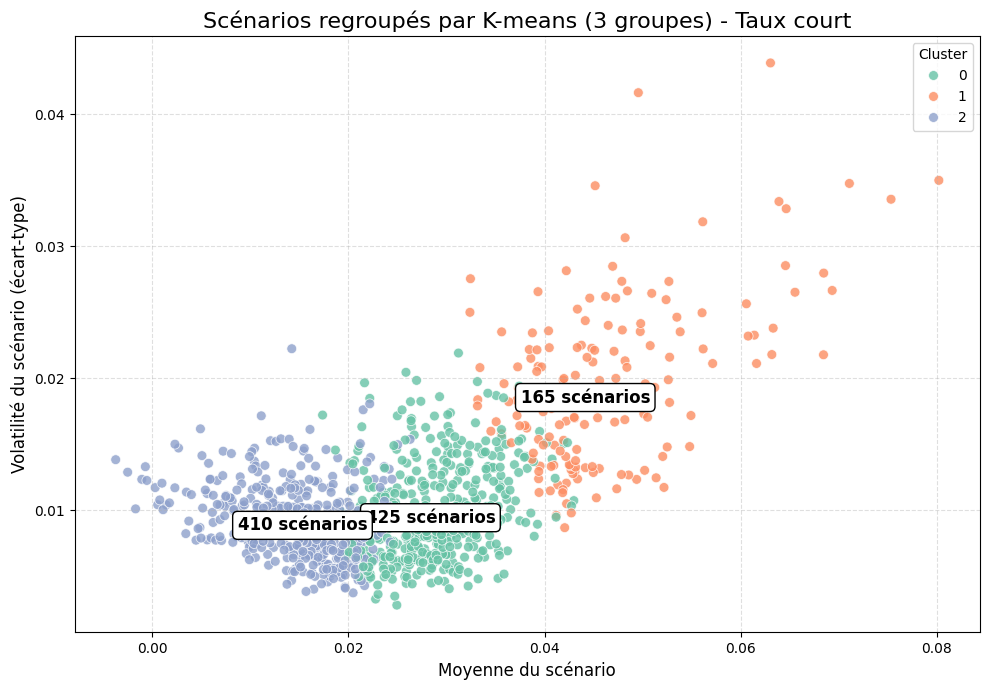

Cluster_0 contient 425 scénarios :
[1, 3, 5, 7, 11, 14, 16, 19, 21, 22, 24, 25, 26, 27, 30, 33, 36, 38, 42, 43]
...
Cluster_1 contient 165 scénarios :
[8, 13, 28, 35, 40, 44, 59, 60, 75, 76, 83, 96, 98, 101, 107, 116, 129, 133, 135, 137]
...
Cluster_2 contient 410 scénarios :
[0, 2, 4, 6, 9, 10, 12, 15, 17, 18, 20, 23, 29, 31, 32, 34, 37, 39, 41, 45]
...


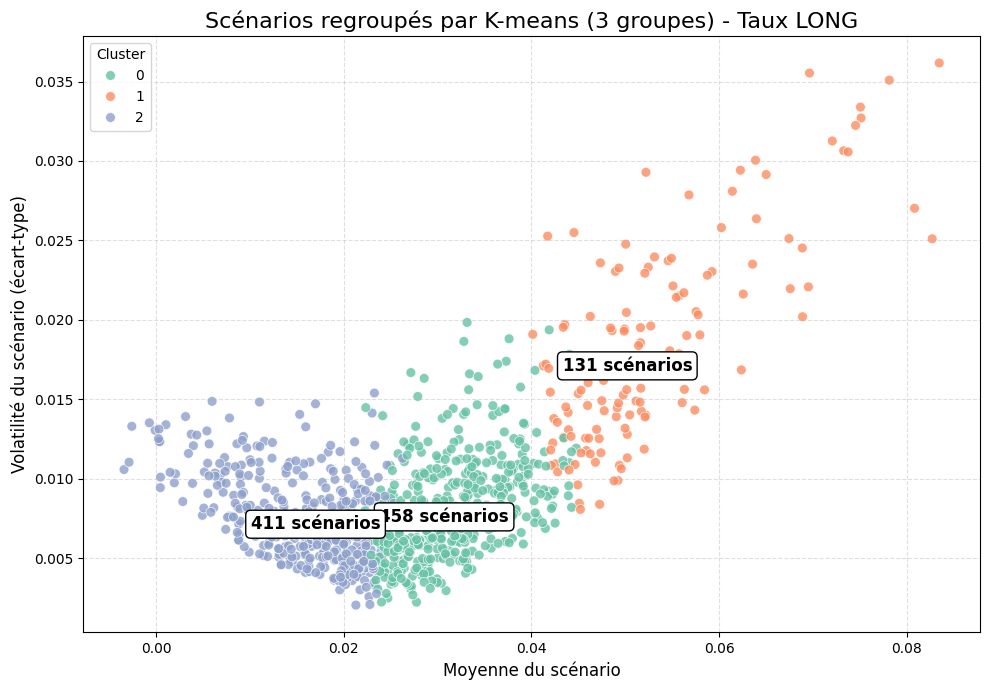

Cluster_0 contient 458 scénarios :
[1, 3, 5, 6, 7, 11, 14, 17, 19, 20, 21, 22, 25, 27, 30, 31, 33, 36, 38, 42]
...
Cluster_1 contient 131 scénarios :
[8, 13, 28, 35, 40, 60, 76, 95, 96, 98, 116, 129, 130, 133, 140, 147, 148, 164, 179, 183]
...
Cluster_2 contient 411 scénarios :
[0, 2, 4, 9, 10, 12, 15, 16, 18, 23, 24, 26, 29, 32, 34, 37, 39, 41, 45, 46]
...


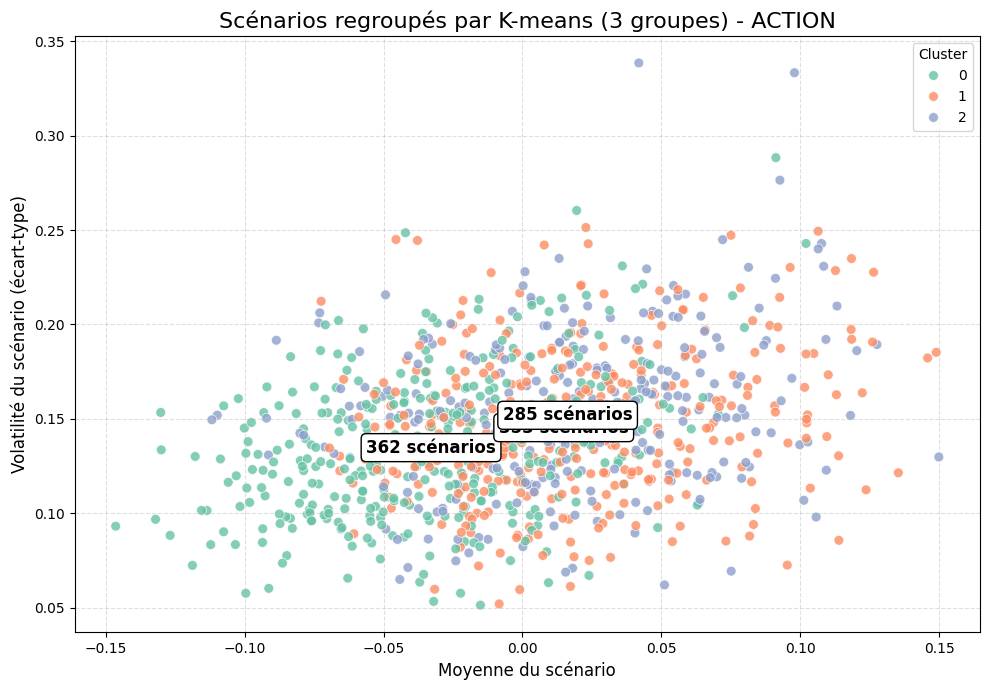

Cluster_0 contient 362 scénarios :
[0, 2, 4, 7, 9, 11, 16, 18, 22, 26, 33, 34, 38, 41, 43, 45, 46, 48, 50, 52]
...
Cluster_1 contient 353 scénarios :
[1, 5, 8, 10, 13, 14, 17, 19, 20, 23, 25, 28, 31, 36, 40, 42, 44, 47, 49, 53]
...
Cluster_2 contient 285 scénarios :
[3, 6, 12, 15, 21, 24, 27, 29, 30, 32, 35, 37, 39, 51, 57, 58, 60, 62, 65, 67]
...


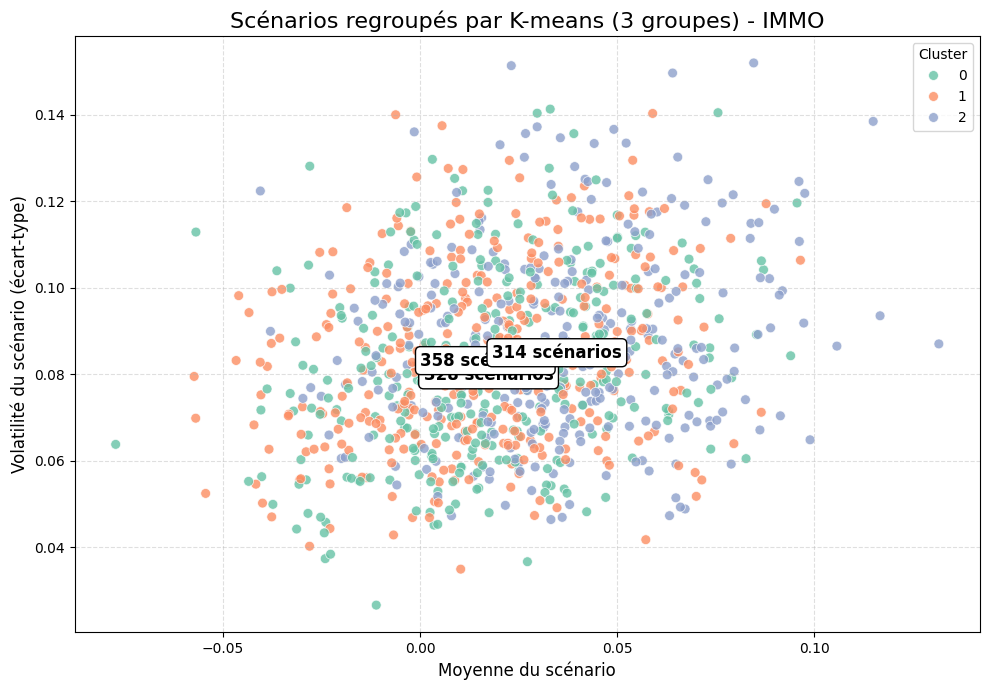

Cluster_0 contient 328 scénarios :
[0, 5, 7, 9, 12, 15, 16, 18, 20, 27, 29, 30, 41, 43, 46, 49, 51, 53, 55, 56]
...
Cluster_1 contient 358 scénarios :
[1, 3, 6, 8, 10, 13, 14, 17, 19, 21, 22, 24, 31, 33, 35, 37, 39, 42, 44, 47]
...
Cluster_2 contient 314 scénarios :
[2, 4, 11, 23, 25, 26, 28, 32, 34, 36, 38, 40, 45, 54, 57, 60, 63, 64, 75, 80]
...


In [47]:
scenarios_by_cluster = cluster_scenarios_kmeans(TL_matrix, "Scénarios regroupés par K-means (3 groupes) - Taux court")
scenarios_by_cluster = cluster_scenarios_kmeans(TLT_matrix, "Scénarios regroupés par K-means (3 groupes) - Taux LONG")
scenarios_by_cluster = cluster_scenarios_kmeans(ACT_matrix, "Scénarios regroupés par K-means (3 groupes) - ACTION")
scenarios_by_cluster = cluster_scenarios_kmeans(IMMO_matrix, "Scénarios regroupés par K-means (3 groupes) - IMMO")

TL_matrix.shape[0] :  1000
Corrélation moyenne : 0.598
Corrélation min : -0.728
Corrélation max : 0.981


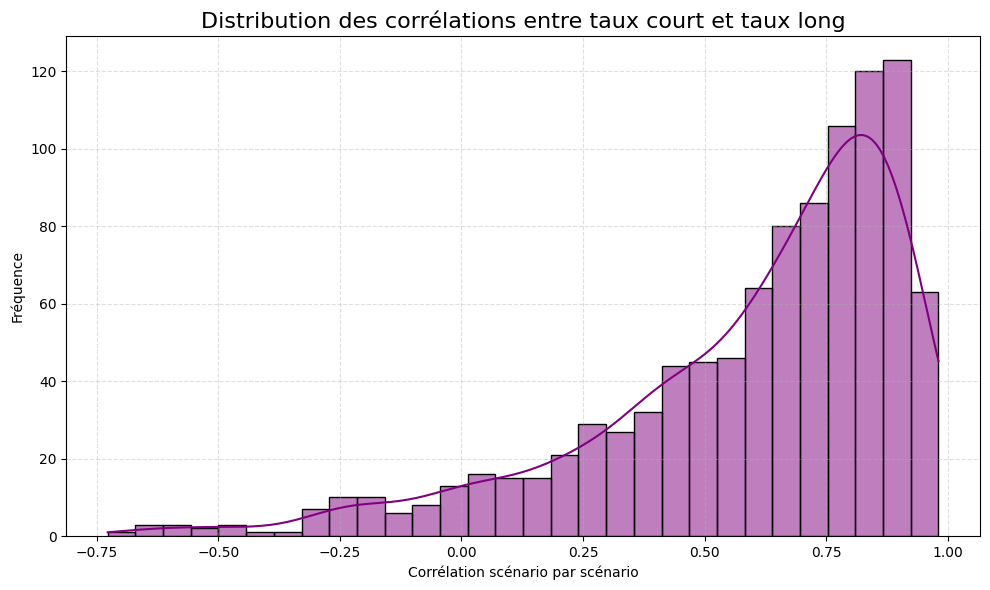

In [43]:

# Vérification des dimensions
assert TL_matrix.shape == TLT_matrix.shape, "Les deux matrices doivent avoir la même forme"
print("TL_matrix.shape[0] : ", TL_matrix.shape[0])

# Étape 1 : Calcul de la corrélation scénario par scénario
correlations = []
for i in range(TL_matrix.shape[0]):
    corr = np.corrcoef(TL_matrix[i], TLT_matrix[i])[0, 1]
    correlations.append(corr)

correlations = np.array(correlations)

# Étape 2 : Statistiques descriptives
print(f"Corrélation moyenne : {np.mean(correlations):.3f}")
print(f"Corrélation min : {np.min(correlations):.3f}")
print(f"Corrélation max : {np.max(correlations):.3f}")

# Étape 3 : Visualisation de la distribution des corrélations
plt.figure(figsize=(10, 6))
sns.histplot(correlations, bins=30, kde=True, color='purple')
plt.title("Distribution des corrélations entre taux court et taux long", fontsize=16)
plt.xlabel("Corrélation scénario par scénario")
plt.ylabel("Fréquence")
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

1.4 Quantiles Par année

# Section 3 - étude statistique exploratoire BE & PVFP

📊 Statistiques descriptives :
                 BE          PVFP
count  9.990000e+02  9.990000e+02
mean   1.182928e+07  8.182578e+05
std    1.325316e+06  3.501620e+05
min    7.933769e+06 -1.162633e+06
25%    1.094057e+07  6.754185e+05
50%    1.173167e+07  8.339008e+05
75%    1.260581e+07  1.020076e+06
max    1.752459e+07  1.867620e+06

🔗 Corrélation BE ↔ PVFP : 0.0424


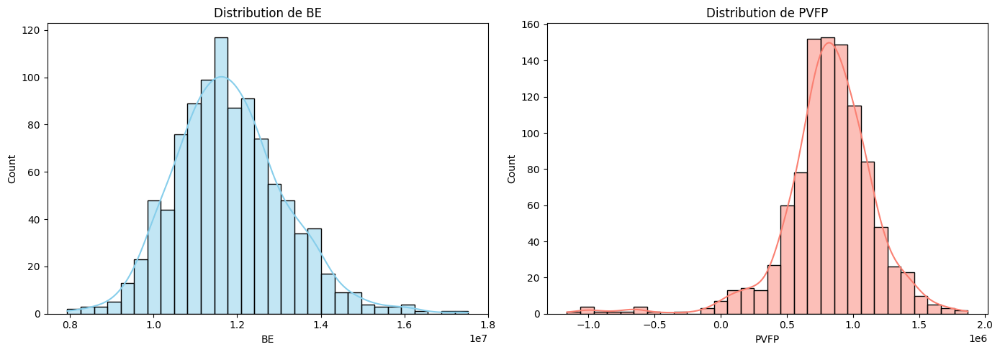

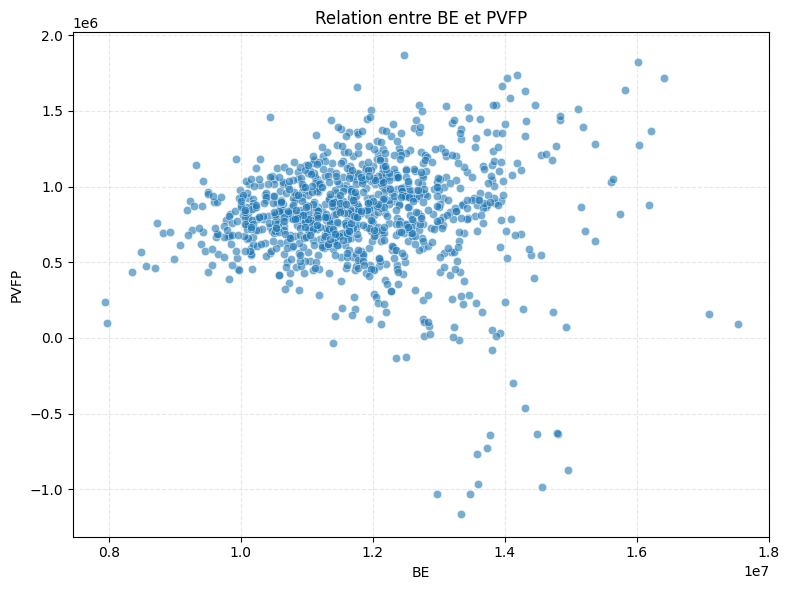

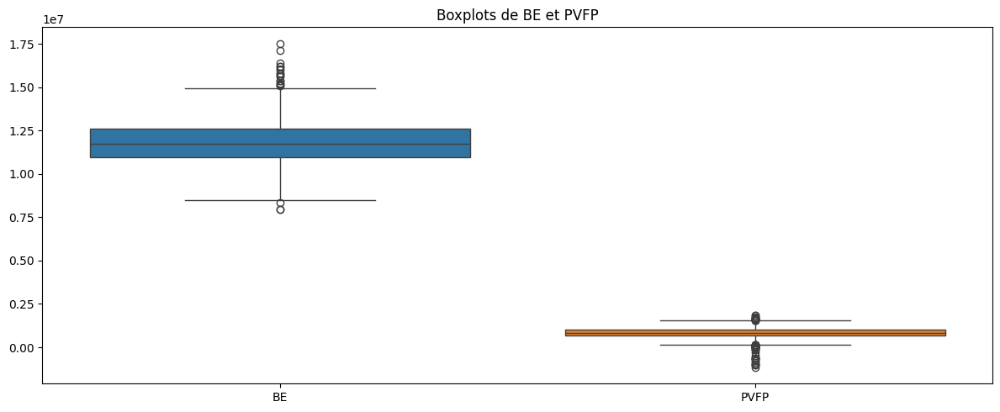

In [ ]:

# Charger les données
df = pd.read_excel("BE_PVFP.xlsx", header=None)
df.columns = ["Scenario", "BE", "PVFP"]

# Nettoyage : suppression des lignes vides ou non numériques
df = df[pd.to_numeric(df["BE"], errors='coerce').notnull()]
df = df[pd.to_numeric(df["PVFP"], errors='coerce').notnull()]
df["BE"] = df["BE"].astype(float)
df["PVFP"] = df["PVFP"].astype(float)

# Statistiques descriptives
print("📊 Statistiques descriptives :")
print(df[["BE", "PVFP"]].describe())

# Corrélation
correlation = df["BE"].corr(df["PVFP"])
print(f"\n🔗 Corrélation BE ↔ PVFP : {correlation:.4f}")

# Histogrammes
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.histplot(df["BE"], bins=30, kde=True, color='skyblue')
plt.title("Distribution de BE")
plt.xlabel("BE")

plt.subplot(1, 2, 2)
sns.histplot(df["PVFP"], bins=30, kde=True, color='salmon')
plt.title("Distribution de PVFP")
plt.xlabel("PVFP")

plt.tight_layout()
plt.show()

# Nuage de points
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x="BE", y="PVFP", alpha=0.6)
plt.title("Relation entre BE et PVFP")
plt.xlabel("BE")
plt.ylabel("PVFP")
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(12, 5))
sns.boxplot(data=df[["BE", "PVFP"]])
plt.title("Boxplots de BE et PVFP")
plt.tight_layout()
plt.show()

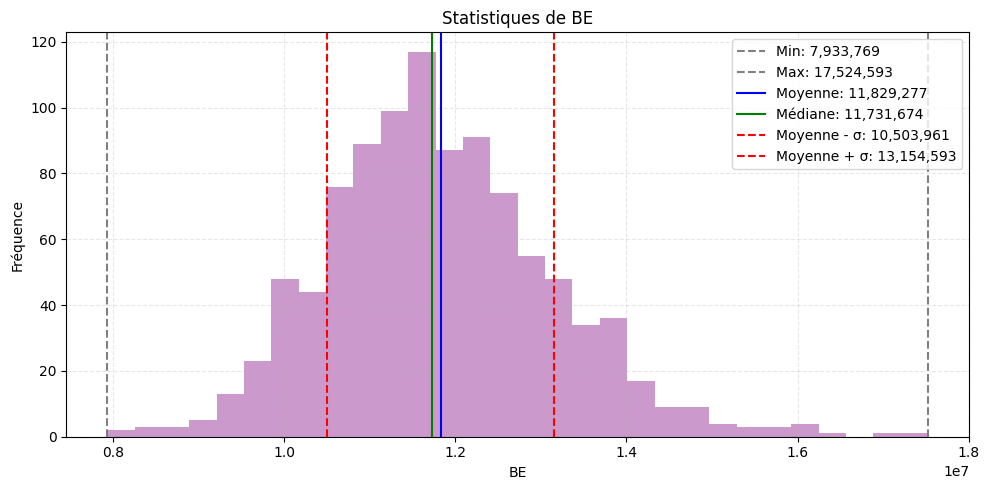

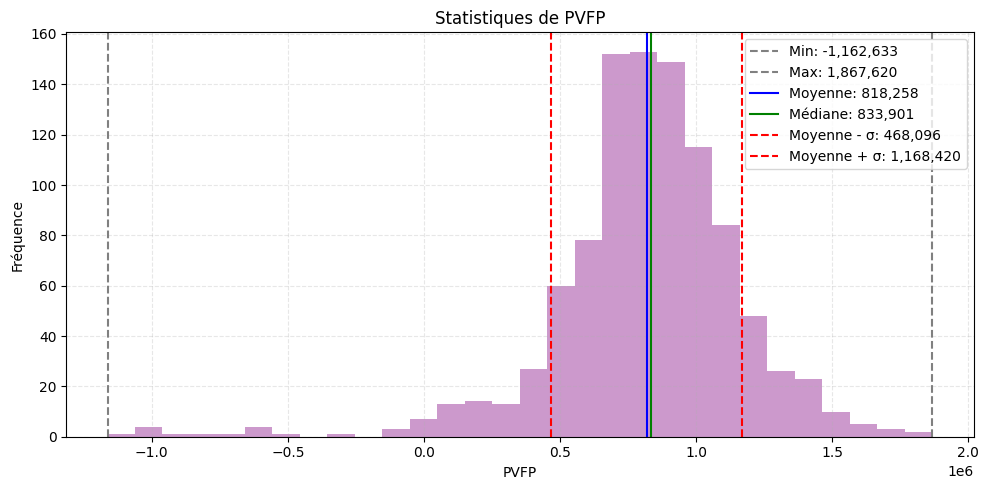

In [ ]:

# Charger les données
df = pd.read_excel("BE_PVFP.xlsx", header=None)
df.columns = ["Scenario", "BE", "PVFP"]

# Nettoyage
df = df[pd.to_numeric(df["BE"], errors='coerce').notnull()]
df = df[pd.to_numeric(df["PVFP"], errors='coerce').notnull()]
df["BE"] = df["BE"].astype(float)
df["PVFP"] = df["PVFP"].astype(float)

# Fonction pour tracer les statistiques
def plot_stat_summary(variable, name):
    data = df[variable]
    mean = data.mean()
    std = data.std()
    median = data.median()
    min_val = data.min()
    max_val = data.max()

    plt.figure(figsize=(10, 5))
    plt.axvline(min_val, color='gray', linestyle='--', label=f"Min: {min_val:,.0f}")
    plt.axvline(max_val, color='gray', linestyle='--', label=f"Max: {max_val:,.0f}")
    plt.axvline(mean, color='blue', linestyle='-', label=f"Moyenne: {mean:,.0f}")
    plt.axvline(median, color='green', linestyle='-', label=f"Médiane: {median:,.0f}")
    plt.axvline(mean - std, color='red', linestyle='--', label=f"Moyenne - σ: {(mean - std):,.0f}")
    plt.axvline(mean + std, color='red', linestyle='--', label=f"Moyenne + σ: {(mean + std):,.0f}")

    plt.hist(data, bins=30, alpha=0.4, color='purple')
    plt.title(f"Statistiques de {name}")
    plt.xlabel(name)
    plt.ylabel("Fréquence")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# Tracer pour BE
plot_stat_summary("BE", "BE")

# Tracer pour PVFP
plot_stat_summary("PVFP", "PVFP")


Clustering corrélation ( BE, PVFP)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

def cluster_be_pvfp(be_df, pvfp_df, plot_title="Clustering BE vs PVFP", k=3):
    """
    Applique K-means sur les colonnes BE et PVFP et trace les clusters.

    Parameters:
    - be_df : DataFrame contenant la colonne "BE"
    - pvfp_df : DataFrame contenant la colonne "PVFP"
    - plot_title : str, titre du graphique
    - k : int, nombre de clusters (par défaut 3)

    Returns:
    - scenarios_by_cluster : dict, clés = "Cluster_i", valeurs = liste des indices de scénarios
    """
    # Étape 1 : Construction de la matrice
    data_matrix = np.column_stack((be_df["BE"].values, pvfp_df["PVFP"].values))

    # Étape 2 : Clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data_matrix)

    # Étape 3 : Visualisation
    plt.figure(figsize=(10, 7))
    palette = sns.color_palette("Set2", k)
    sns.scatterplot(x=data_matrix[:, 0], y=data_matrix[:, 1], hue=labels,
                    palette=palette, s=60, alpha=0.85)

    # Annotation des clusters
    for cluster in range(k):
        indices = np.where(labels == cluster)[0]
        x_cluster = data_matrix[indices, 0]
        y_cluster = data_matrix[indices, 1]
        count = len(indices)
        x_text = np.median(x_cluster)
        y_text = np.median(y_cluster)
        plt.text(x_text, y_text, f"{count} scénarios", fontsize=12, weight='bold',
                 ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    # Personnalisation
    plt.title(plot_title, fontsize=16)
    plt.xlabel("BE", fontsize=12)
    plt.ylabel("PVFP", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

    # Regrouper les indices par cluster
    scenarios_by_cluster = {}
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        scenarios_by_cluster[f"Cluster_{cluster_id}"] = indices.tolist()

    # Affichage résumé
    for name, scenario_list in scenarios_by_cluster.items():
        print(f"{name} contient {len(scenario_list)} scénarios :")
        print(scenario_list[:20])
        print("...")

    return scenarios_by_cluster

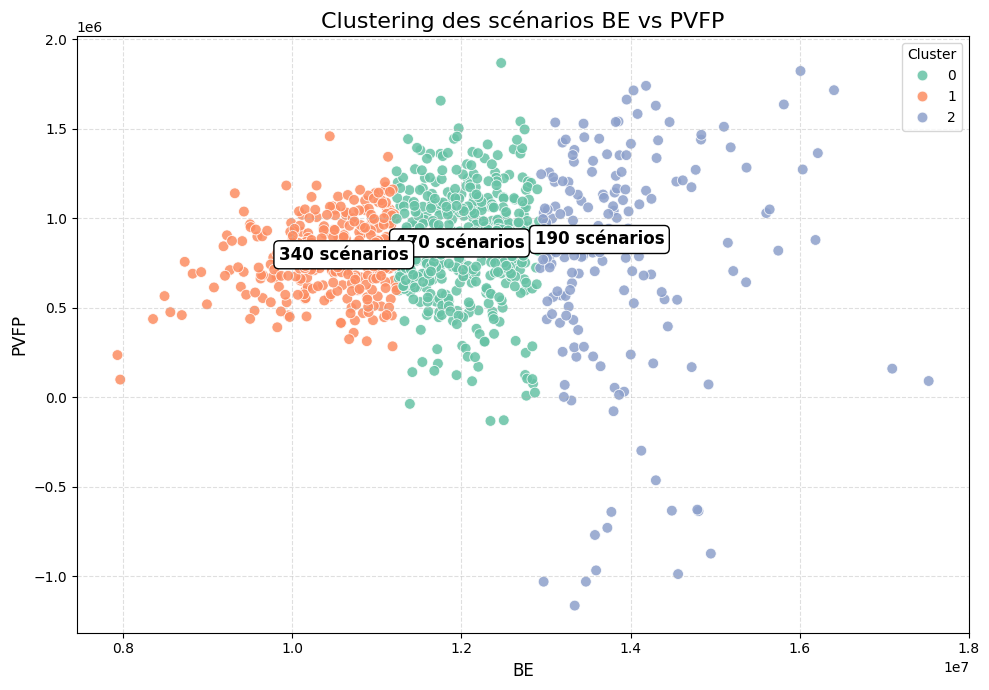

Cluster_0 contient 470 scénarios :
[2, 3, 7, 8, 9, 10, 14, 15, 16, 17, 19, 21, 23, 24, 25, 30, 34, 35, 36, 37]
...
Cluster_1 contient 340 scénarios :
[0, 5, 6, 11, 13, 18, 20, 22, 27, 28, 31, 33, 38, 40, 49, 60, 62, 70, 72, 75]
...
Cluster_2 contient 190 scénarios :
[1, 4, 12, 26, 29, 32, 39, 41, 63, 71, 73, 77, 79, 81, 82, 97, 101, 107, 110, 114]
...


{'Cluster_0': [2,
  3,
  7,
  8,
  9,
  10,
  14,
  15,
  16,
  17,
  19,
  21,
  23,
  24,
  25,
  30,
  34,
  35,
  36,
  37,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  61,
  64,
  65,
  66,
  67,
  68,
  69,
  74,
  84,
  85,
  86,
  87,
  88,
  90,
  91,
  92,
  94,
  95,
  99,
  102,
  104,
  108,
  109,
  112,
  117,
  119,
  122,
  127,
  130,
  131,
  134,
  136,
  137,
  138,
  139,
  140,
  141,
  148,
  149,
  152,
  153,
  154,
  155,
  156,
  157,
  158,
  159,
  161,
  162,
  167,
  168,
  170,
  173,
  174,
  178,
  186,
  187,
  188,
  189,
  193,
  195,
  196,
  197,
  206,
  207,
  208,
  209,
  214,
  215,
  218,
  220,
  221,
  224,
  226,
  227,
  228,
  229,
  230,
  236,
  237,
  244,
  248,
  249,
  254,
  255,
  256,
  258,
  261,
  268,
  274,
  275,
  276,
  278,
  279,
  280,
  281,
  282,
  283,
  284,
  285,
  291,
  294,
  295,
  298,
  299,
  301,
  307,
  310,
  311,
  312,
  313,
  318,
  319

In [ ]:
cluster_be_pvfp(be_df, pvfp_df, plot_title="Clustering des scénarios BE vs PVFP", k=3)

Clustering PVFP

In [ ]:
def cluster_pvfp(pvfp_df, plot_title="Clustering sur PVFP", k=3):
    pvfp_values = pvfp_df["PVFP"].values.reshape(-1, 1)
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pvfp_values)

    plt.figure(figsize=(10, 5))
    palette = sns.color_palette("Set2", k)
    sns.scatterplot(x=range(len(pvfp_values)), y=pvfp_values.flatten(), hue=labels,
                    palette=palette, s=60, alpha=0.85)

    # Ajouter le nombre de points par cluster
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        y_cluster = pvfp_values[indices].flatten()
        x_text = np.median(indices)
        y_text = np.median(y_cluster)
        count = len(indices)
        plt.text(x_text, y_text, f"{count} pts", fontsize=11, weight='bold',
                 ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    plt.title(plot_title, fontsize=16)
    plt.xlabel("Index scénario", fontsize=12)
    plt.ylabel("PVFP", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

    clusters = {}
    for cluster_id in range(k):
        indices = np.where(labels == cluster_id)[0]
        clusters[f"Cluster_{cluster_id}"] = indices.tolist()
        # print(f"Cluster_{cluster_id} contient {len(indices)} scénarios : {indices[:20]}...")
        clusters[f"Cluster_{cluster_id}"] = indices
        print(f"Cluster_{cluster_id} contient {len(indices)} scénarios:")
        print("Premiers 20 scénarios :", ", ".join(map(str, indices[:20])))

    return clusters

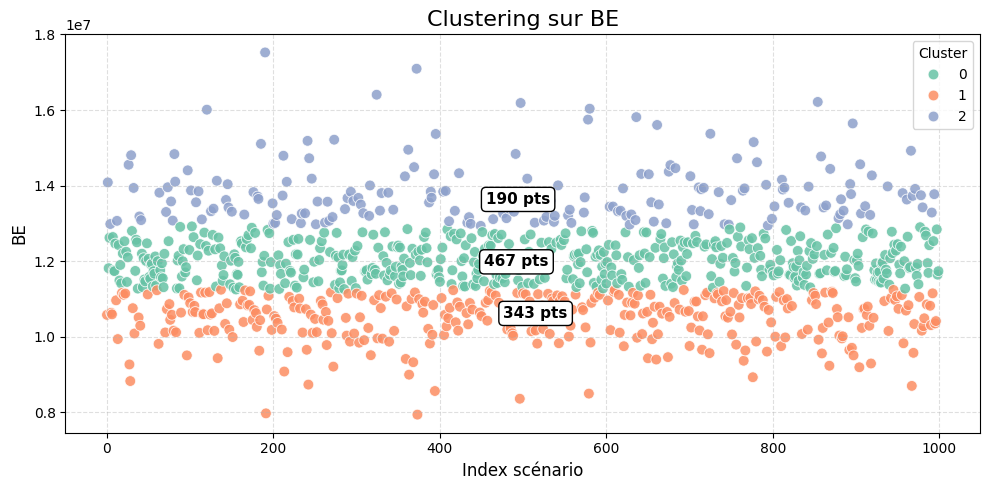

Cluster_0 contient 467 scénarios.
Premiers 20 scénarios : 2, 3, 7, 8, 9, 10, 14, 15, 16, 17, 19, 21, 23, 24, 25, 30, 34, 35, 36, 37
Cluster_1 contient 343 scénarios.
Premiers 20 scénarios : 0, 5, 6, 11, 13, 18, 20, 22, 27, 28, 31, 33, 38, 40, 49, 60, 62, 70, 72, 75
Cluster_2 contient 190 scénarios.
Premiers 20 scénarios : 1, 4, 12, 26, 29, 32, 39, 41, 63, 71, 73, 77, 79, 81, 82, 97, 101, 107, 110, 114


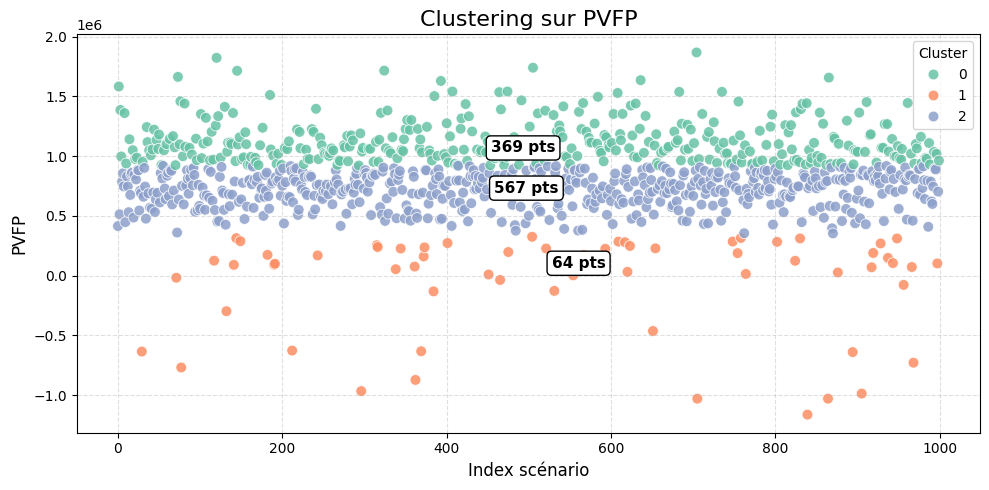

Cluster_0 contient 369 scénarios:
Premiers 20 scénarios : 1, 3, 4, 8, 10, 14, 18, 21, 23, 30, 35, 36, 38, 40, 42, 44, 47, 49, 50, 53
Cluster_1 contient 64 scénarios:
Premiers 20 scénarios : 29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362
Cluster_2 contient 567 scénarios:
Premiers 20 scénarios : 0, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28


{'Cluster_0': array([  1,   3,   4,   8,  10,  14,  18,  21,  23,  30,  35,  36,  38,
         40,  42,  44,  47,  49,  50,  53,  56,  59,  63,  67,  69,  70,
         73,  75,  76,  79,  81,  82,  87,  90,  95,  96, 101, 102, 104,
        107, 109, 112, 114, 116, 119, 120, 122, 125, 130, 133, 134, 137,
        138, 140, 143, 145, 146, 148, 151, 153, 155, 156, 158, 161, 162,
        167, 168, 171, 173, 176, 185, 186, 189, 193, 195, 199, 203, 206,
        208, 218, 221, 222, 226, 229, 231, 233, 236, 238, 241, 244, 246,
        248, 251, 252, 255, 257, 258, 260, 262, 267, 269, 270, 275, 276,
        279, 280, 282, 284, 286, 293, 295, 297, 298, 305, 307, 311, 314,
        317, 318, 320, 324, 326, 328, 330, 332, 334, 340, 345, 347, 348,
        350, 352, 355, 357, 365, 367, 368, 370, 376, 379, 380, 382, 385,
        389, 393, 397, 399, 400, 402, 404, 407, 408, 410, 413, 417, 418,
        421, 423, 425, 427, 431, 437, 441, 442, 447, 448, 450, 453, 455,
        456, 459, 460, 463, 464, 466, 

In [ ]:
cluster_be(be_df, k=3)
cluster_pvfp(pvfp_df, k=3)

Exemple Clustering 1 : afficher pour 4 paramètres les trajectoires classifiés dans le clustering 1

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_individual_gse(cluster_indices, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1):
    params = {
        "Taux court (TL)": TL_matrix,
        "Taux long (TLT)": TLT_matrix,
        "Action (ACT)": ACT_matrix,
        "Immobilier (IMMO)": IMMO_matrix
    }

    # S'assurer que cluster_indices est une liste d'entiers
    cluster_indices = list(np.array(cluster_indices).flatten())

    for name, matrix in params.items():
        plt.figure(figsize=(12, 5))

        # Tracer chaque trajectoire
        for idx in cluster_indices:
            plt.plot(range(matrix.shape[1]), matrix[idx, :], alpha=0.4, linewidth=1)

        # 🔍 Trouver les deux trajectoires les plus hautes
        max_vals = []
        for idx in cluster_indices:
            local_max = matrix[idx, :].max()
            max_vals.append((local_max, idx))

        # Trier par valeur max décroissante
        max_vals_sorted = sorted(max_vals, key=lambda x: x[0], reverse=True)

        # Prendre les deux premiers
        top_two = max_vals_sorted[:2]

        # Ajouter une annotation pour chacun
        for rank, (val, idx) in enumerate(top_two, start=1):
            year_max = np.argmax(matrix[idx, :])  # année où la valeur est max
            plt.plot(range(matrix.shape[1]), matrix[idx, :], linewidth=2,
                     label=f"Top {rank} – Scénario {idx}")
            plt.text(year_max, val, f"Scénario {idx}", fontsize=11, weight="bold",
                     ha="center", va="bottom", color="black",
                     bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.3"))

        # Ajuster les axes
        plt.title(f"Trajectoires individuelles – {name} – Cluster {cluster_id}", fontsize=15)
        plt.xlabel("Année", fontsize=12)
        plt.ylabel("Valeur", fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)

        # 🔧 Forcer l'échelle demandée
        plt.xlim(0, 45)       # Axe X jusqu’à 45 ans
        plt.ylim(top=0.8)     # Borne supérieure fixée à 0.8, borne inférieure automatique

        plt.legend()
        plt.tight_layout()
        plt.show()

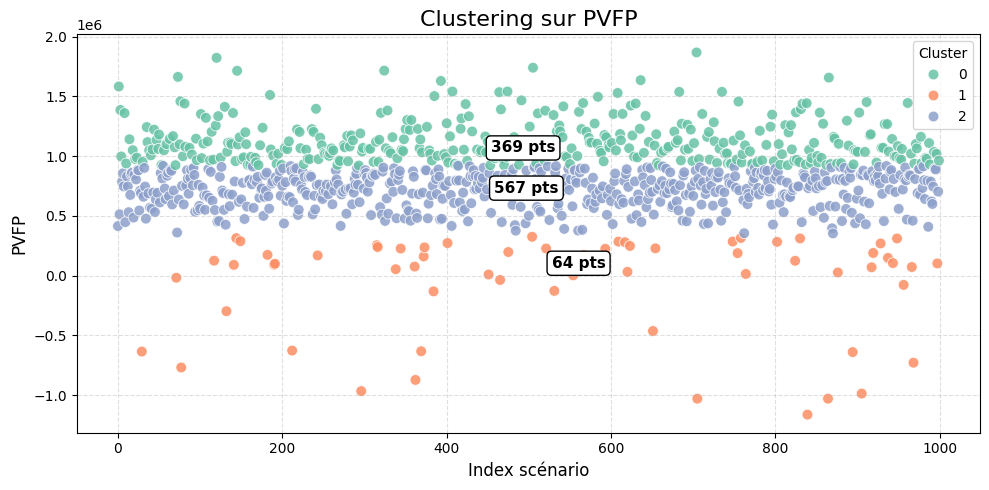

Cluster_0 contient 369 scénarios:
Premiers 20 scénarios : 1, 3, 4, 8, 10, 14, 18, 21, 23, 30, 35, 36, 38, 40, 42, 44, 47, 49, 50, 53
Cluster_1 contient 64 scénarios:
Premiers 20 scénarios : 29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362
Cluster_2 contient 567 scénarios:
Premiers 20 scénarios : 0, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28


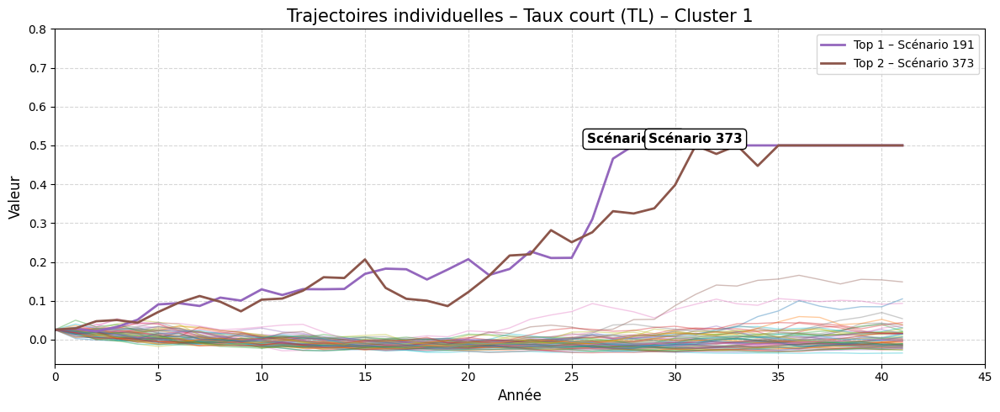

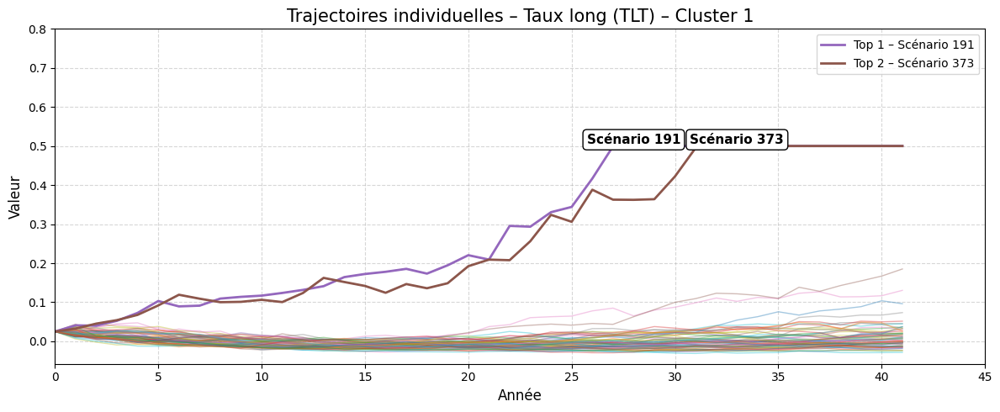

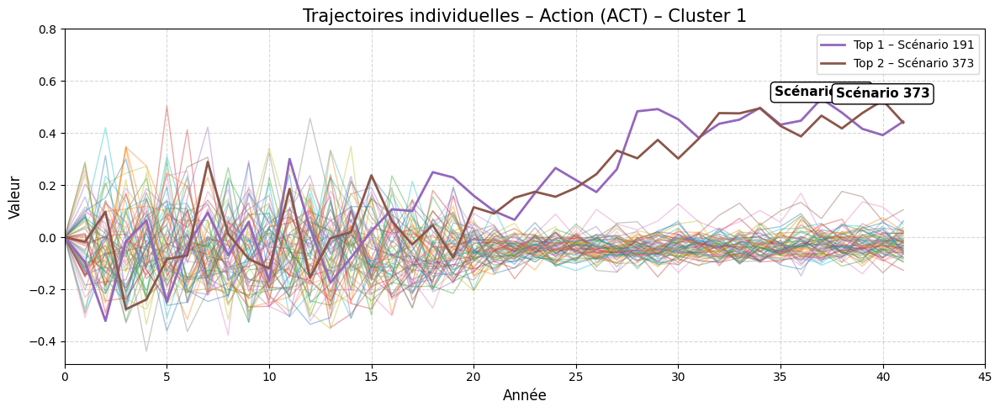

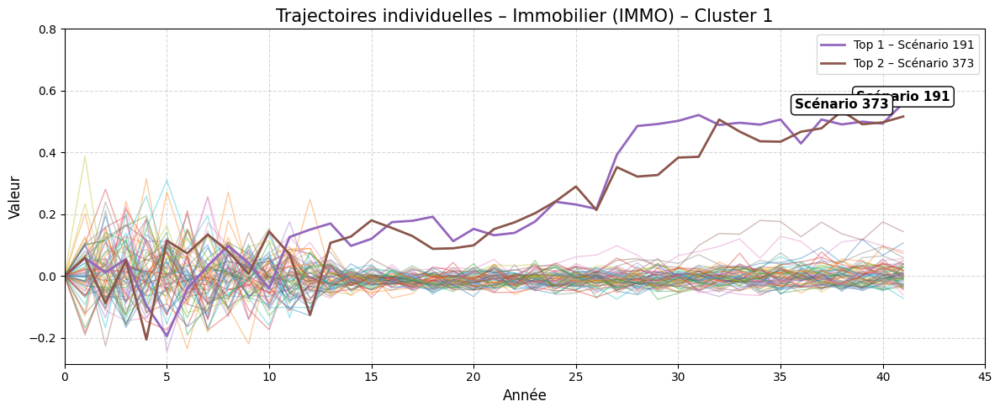

In [ ]:
clusters = cluster_pvfp(pvfp_df, k=3)
plot_individual_gse(clusters["Cluster_1"], TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1)

pour N° scénario fixé, Plot scénario et la valeur de scénario

📋 Scénario 191 – Valeurs Action :
[ 0.         -0.09614791 -0.32144154 -0.01602026  0.0650843  -0.24939791
 -0.03304855  0.09433864 -0.06939208  0.05954242 -0.1676615   0.30048654
  0.03461983 -0.17480481 -0.07869643  0.0228514   0.10709302  0.10062038
  0.24977193  0.22931313  0.15961881  0.10015672  0.06664237  0.16975092
  0.26583804  0.21926685  0.17338791  0.26102273  0.48342872  0.49194762
  0.45275113  0.38166103  0.43556518  0.45152122  0.49716331  0.43225883
  0.4473565   0.53230053  0.47843603  0.41609088  0.39197393  0.44413413]
📋 Scénario 373 – Valeurs Action :
[ 0.         -0.01763049  0.09790552 -0.27664072 -0.23923954 -0.0841314
 -0.0701576   0.28940293  0.01258128 -0.08304023 -0.11993841  0.18566676
 -0.15525005 -0.00419676  0.01965592  0.23755996  0.06243503 -0.02813288
  0.04641902 -0.07863592  0.11513607  0.09078573  0.15148311  0.17451972
  0.15530341  0.18954324  0.24218018  0.33264571  0.30301168  0.37361932
  0.30208566  0.37799782  0.47659429  0.47563161  0.4949

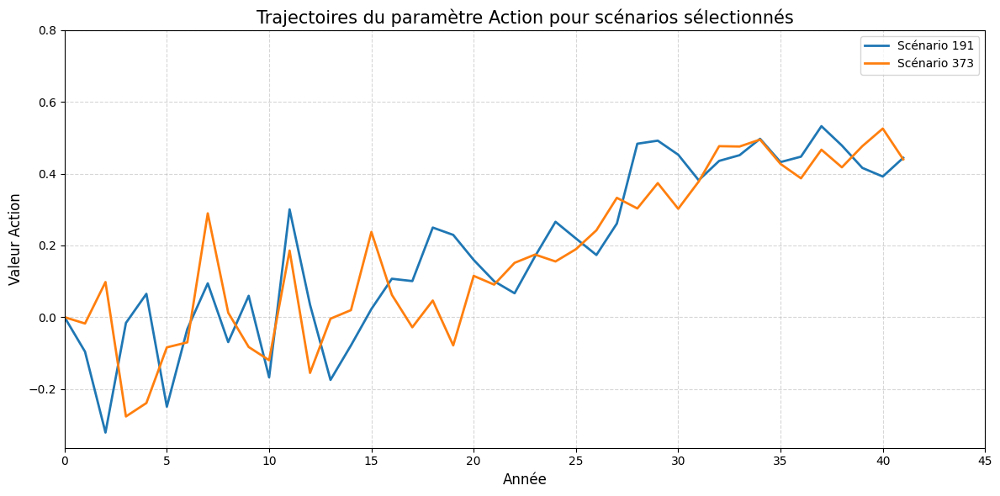

In [ ]:
import matplotlib.pyplot as plt

def plot_and_print_action(ACT_matrix, scenario_ids=[191, 373]):
    plt.figure(figsize=(12, 6))

    for sid in scenario_ids:
        values = ACT_matrix[sid, :]   # les 42 valeurs du scénario
        print(f"📋 Scénario {sid} – Valeurs Action :")
        print(values)  # affiche toutes les valeurs dans la console

        # Tracer la trajectoire
        plt.plot(range(ACT_matrix.shape[1]), values, linewidth=2, label=f"Scénario {sid}")

    plt.title("Trajectoires du paramètre Action pour scénarios sélectionnés", fontsize=15)
    plt.xlabel("Année", fontsize=12)
    plt.ylabel("Valeur Action", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.xlim(0, 45)   # Axe X jusqu’à 45 ans
    plt.ylim(top=0.8) # Axe Y max fixé à 0.8, min auto
    plt.tight_layout()
    plt.show()

# Exemple d'utilisation
plot_and_print_action(ACT_matrix, scenario_ids=[191, 373])

Pour Taux court et Taux long : calculer le NB de taux < 0% permis 42 ans

In [ ]:

# Fonction 1 : compter le nombre d'années où le taux est inférieur à un seuil
def count_years_below_threshold(matrix, seuil=0.0, title="Résultat - années sous seuil"):
    """
    Compte et affiche le nombre de points (scénario × année) où le taux est inférieur au seuil.
    """
    count = (matrix < seuil).sum()
    print(f"{title} : {count} (seuil = {seuil})")
    return count


# Fonction 2 : compter le nombre de variations inter-annuelles supérieures à un seuil
def count_variations_above_threshold(matrix, seuil_var=0.04, title="Résultat - variations au-dessus du seuil"):
    """
    Compte et affiche le nombre de variations inter-annuelles supérieures au seuil.
    """
    variations = np.diff(matrix, axis=1)
    count = (variations > seuil_var).sum()
    print(f"{title} : {count} (seuil = {seuil_var})")
    return count

In [ ]:
# Supposons que TL_matrix et TLT_matrix soient définis
count_years_below_threshold(TL_matrix, seuil=0.0, title="Taux court < 0%")
count_years_below_threshold(TLT_matrix, seuil=0.0, title="Taux long < 0%")
count_years_below_threshold(ACT_matrix, seuil=0.0, title="Revalorisation action < 0%")
count_years_below_threshold(IMMO_matrix, seuil=0.0, title="Revalorisation IMMO < 0%")

count_variations_above_threshold(TL_matrix, seuil_var=0.04, title="Variations intra-annuelle taux court > 4%")
count_variations_above_threshold(TLT_matrix, seuil_var=0.04, title="Variations intra-annuelle taux long > 4%")
count_variations_above_threshold(ACT_matrix, seuil_var=0.05, title="Variations intra-annuelle ACTION > 5%")
count_variations_above_threshold(ACT_matrix, seuil_var=0.05, title="Variations intra-annuelle IMMO > 5%")

Taux court < 0% : 4278 (seuil = 0.0)
Taux long < 0% : 2825 (seuil = 0.0)
Revalorisation action < 0% : 18576 (seuil = 0.0)
Revalorisation IMMO < 0% : 9641 (seuil = 0.0)
Variations intra-annuelle taux court > 4% : 471 (seuil = 0.04)
Variations intra-annuelle taux long > 4% : 253 (seuil = 0.04)
Variations intra-annuelle ACTION > 5% : 11885 (seuil = 0.05)
Variations intra-annuelle IMMO > 5% : 11885 (seuil = 0.05)


np.int64(11885)

Matrice des variation inter-annuelles

In [ ]:
import numpy as np

# Calcul de la matrice des variations inter-annuelles pour le taux court
var_TL = np.diff(TL_matrix, axis=1)
print("Matrice des variations inter-annuelles - Taux court (TL) :")
print(var_TL)

# Calcul de la matrice des variations inter-annuelles pour le taux long
var_TLT = np.diff(TLT_matrix, axis=1)
print("\nMatrice des variations inter-annuelles - Taux long (TLT) :")
print(var_TLT)

Matrice des variations inter-annuelles - Taux court (TL) :
[[ 0.01586887  0.00421689 -0.01798701 ... -0.00688483  0.00889514
   0.00264469]
 [-0.01848702 -0.00297842  0.01489782 ...  0.04010862 -0.03146172
  -0.00193415]
 [-0.00618347 -0.00759255 -0.00411148 ...  0.00074241 -0.00569738
   0.01461982]
 ...
 [-0.00813431 -0.01215668 -0.00240545 ... -0.01146575 -0.00140597
  -0.00089041]
 [-0.0049511   0.00119367 -0.00466797 ...  0.02523742  0.03991431
   0.01256221]
 [-0.00186047 -0.00193401  0.00805204 ... -0.00418337 -0.00650183
  -0.00042707]]

Matrice des variations inter-annuelles - Taux long (TLT) :
[[ 0.00609277  0.00297659 -0.00247907 ...  0.00678772 -0.00082733
   0.00816059]
 [-0.0050111  -0.00146889  0.00224649 ... -0.0107076   0.00285541
  -0.01994142]
 [-0.0049412   0.00240595  0.00097592 ...  0.00592221  0.00675677
  -0.00433596]
 ...
 [-0.00850627 -0.01037949  0.00023556 ...  0.00492512  0.00103446
  -0.00292514]
 [-0.00040571 -0.00847998 -0.00607662 ...  0.02442953 -0.004

Vérification en Excel -  Clustering 1 : afficher pour 4 paramètres les trajectoires classifiés dans le clustering 1

In [ ]:
# Supposons que tu as déjà exécuté :
# clusters = cluster_pvfp(pvfp_df, k=3)

# Extraire les indices du Cluster 1
cluster_1_indices = clusters["Cluster_1"]

# Afficher tous les numéros de scénario
print("📋 Numéros de scénario dans Cluster 1 :")
print(", ".join(map(str, cluster_1_indices)))

📋 Numéros de scénario dans Cluster 1 :
29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362, 369, 372, 373, 384, 401, 451, 465, 475, 504, 521, 531, 554, 567, 585, 593, 609, 617, 620, 623, 651, 654, 705, 748, 754, 758, 764, 802, 824, 830, 839, 864, 876, 894, 905, 917, 919, 928, 937, 943, 948, 956, 966, 968, 997


In [ ]:
import pandas as pd

# Extraire les indices du Cluster 1
cluster_1_indices = clusters["Cluster_1"]

# Créer un DataFrame
df_cluster_1 = pd.DataFrame({"Scenario_ID": cluster_1_indices})

# Sauvegarder en Excel
df_cluster_1.to_excel("cluster_1_scenarios.xlsx", index=False)

# Télécharger le fichier
from google.colab import files
files.download("cluster_1_scenarios.xlsx")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Pour chaque Paramètre, tracer les jrajectoire IN/OUT cluserting 1

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_vs_others(cluster_indices, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1):
    params = {
        "Taux court (TL)": TL_matrix,
        "Taux long (TLT)": TLT_matrix,
        "Action (ACT)": ACT_matrix,
        "Immobilier (IMMO)": IMMO_matrix
    }

    # Convertir indices en liste d'entiers
    cluster_indices = list(np.array(cluster_indices).flatten())
    all_indices = set(range(TL_matrix.shape[0]))
    other_indices = list(all_indices - set(cluster_indices))

    for name, matrix in params.items():
        plt.figure(figsize=(12, 5))

        # Tracer les scénarios hors cluster 1 (gris clair)
        for idx in other_indices:
            plt.plot(range(matrix.shape[1]), matrix[idx, :], color="lightgray", alpha=0.4)

        # Tracer les scénarios du cluster 1 (rouge)
        for idx in cluster_indices:
            plt.plot(range(matrix.shape[1]), matrix[idx, :], color="pink", alpha=0.7)

        plt.title(f"Trajectoires – {name} – Cluster {cluster_id} vs autres", fontsize=15)
        plt.xlabel("Année", fontsize=12)
        plt.ylabel("Valeur", fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.xlim(0, 45)   # Axe X jusqu’à 45 ans
        plt.ylim(top=0.8) # Axe Y max fixé à 0.8, min auto
        plt.tight_layout()
        plt.show()

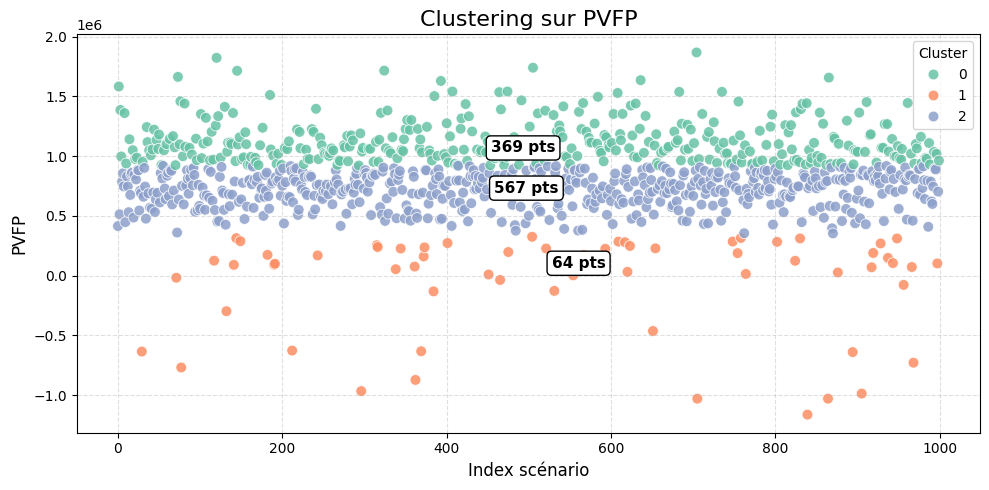

Cluster_0 contient 369 scénarios:
Premiers 20 scénarios : 1, 3, 4, 8, 10, 14, 18, 21, 23, 30, 35, 36, 38, 40, 42, 44, 47, 49, 50, 53
Cluster_1 contient 64 scénarios:
Premiers 20 scénarios : 29, 71, 77, 117, 132, 141, 144, 149, 182, 190, 191, 212, 243, 296, 315, 316, 338, 344, 361, 362
Cluster_2 contient 567 scénarios:
Premiers 20 scénarios : 0, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 28


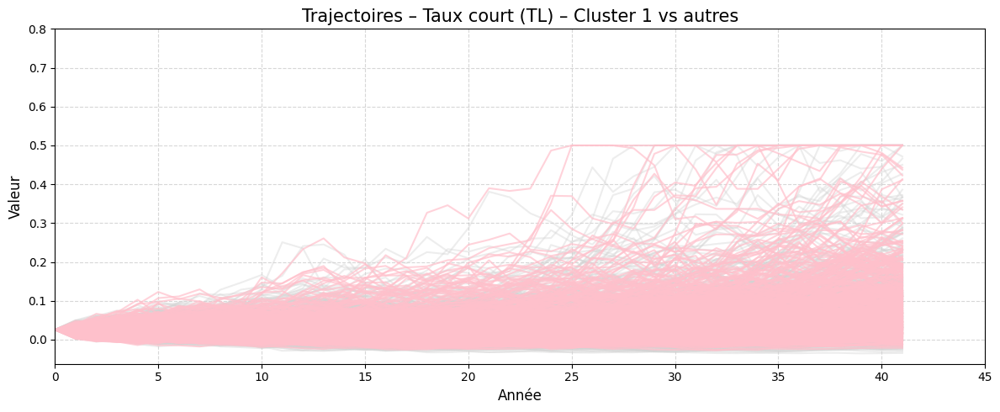

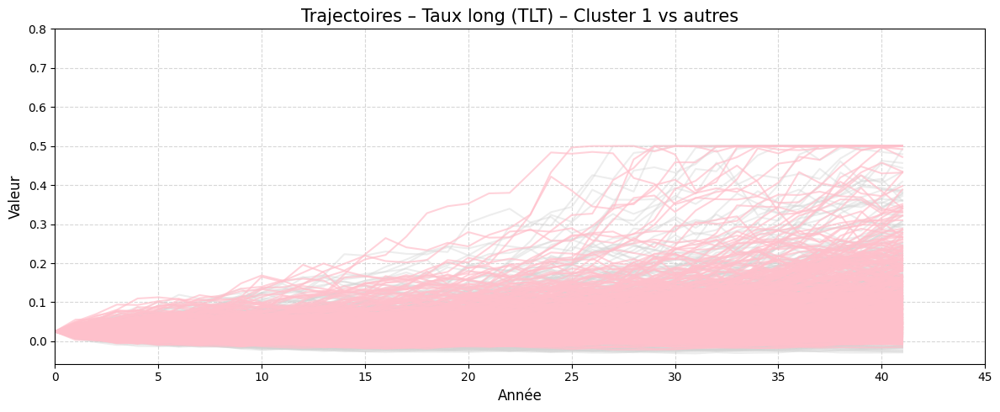

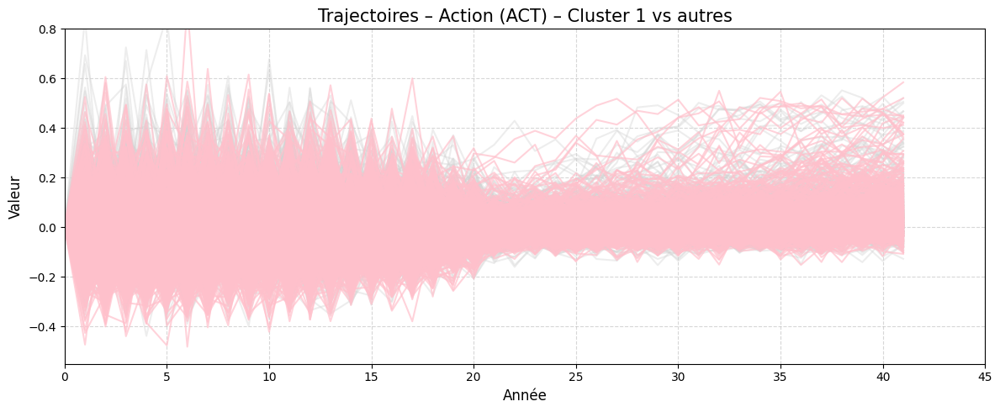

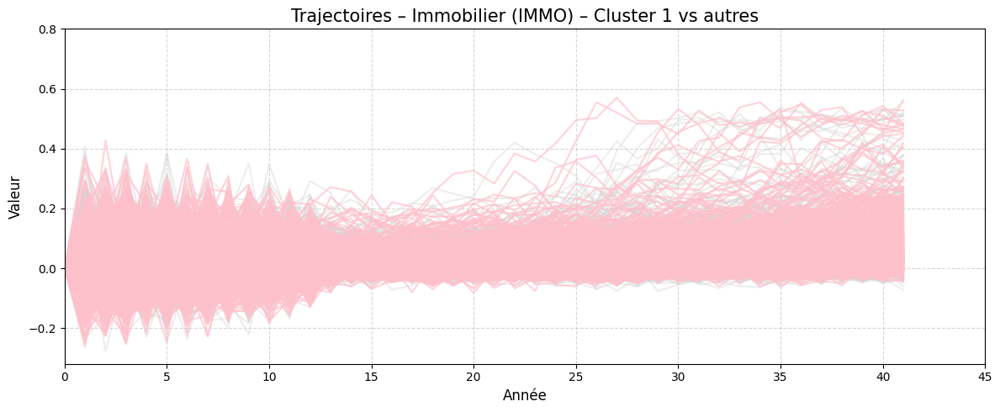

In [ ]:
clusters = cluster_pvfp(pvfp_df, k=3)

# Tracer les trajectoires pour Cluster 1 vs autres
plot_cluster_vs_others(clusters["Cluster_2"], TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, cluster_id=1)

3D Plot : 1000 scnéario & 42 ans, point négative & positive

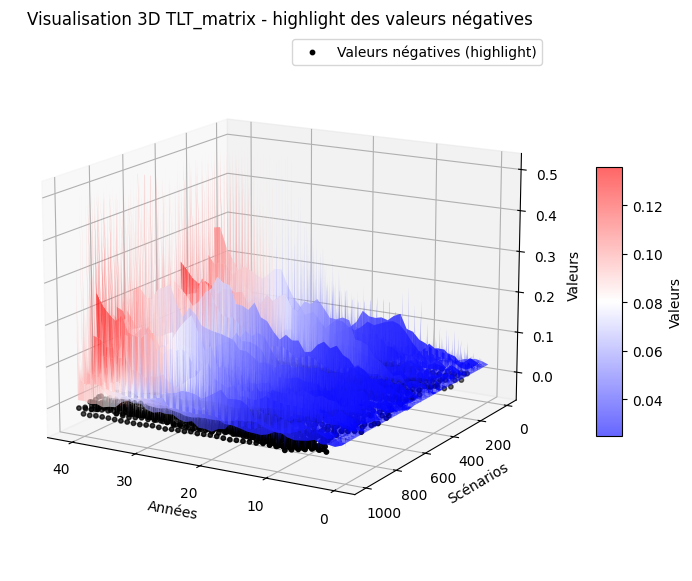

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap


# Exemple : TLT_matrix est déjà défini (shape: 1000 x 42)
# TLT_matrix = np.random.randn(1000, 42)  # à remplacer par tes données réelles

n_scenarios, n_years = TLT_matrix.shape

# Créer les axes
X = np.arange(n_years)
Y = np.arange(n_scenarios)
X, Y = np.meshgrid(X, Y)
Z = TLT_matrix

fig = plt.figure(figsize=(12,7))
ax = fig.add_subplot(111, projection='3d')

colors = ["blue","white","red"]
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

# Surface globale
surf = ax.plot_surface(X, Y, Z, cmap=custom_cmap, edgecolor='none', alpha=0.6)

# Points négatifs en scatter pour les mettre en évidence
neg_idx = Z < 0
ax.scatter(X[neg_idx], Y[neg_idx], Z[neg_idx],
           color='black', s=10, label='Valeurs négatives (highlight)')

# Angle de vue
ax.view_init(elev=15, azim=120)

# Titres et labels
ax.set_title("Visualisation 3D TLT_matrix - highlight des valeurs négatives")
ax.set_xlabel("Années")
ax.set_ylabel("Scénarios")
ax.set_zlabel("Valeurs")
fig.colorbar(surf, shrink=0.5, aspect=10, label="Valeurs")
ax.legend()

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap

def plot_matrix_3d(matrix, title="Visualisation 3D"):
    """
    Affiche un plot 3D pour une matrice (scénarios × années).
    Les valeurs négatives apparaissent en gris, zéro en blanc, positives en vert.

    Paramètres :
    - matrix : numpy array de shape (n_scenarios, n_years)
    - title  : titre du graphique
    """
    n_scenarios, n_years = matrix.shape

    # Créer les axes
    X = np.arange(n_years)
    Y = np.arange(n_scenarios)
    X, Y = np.meshgrid(X, Y)
    Z = matrix

    # Colormap personnalisée
    colors = ["blue", "white", "red"]
    custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

    # Plot 3D
    fig = plt.figure(figsize=(12,7))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(X, Y, Z, cmap=custom_cmap, edgecolor='none')

    # Points négatifs en scatter pour les mettre en évidence
    neg_idx = Z < 0
    ax.scatter(X[neg_idx], Y[neg_idx], Z[neg_idx],color='black', s=10, label='Valeurs négatives (highlight)')

    # Angle de vue
    # ax.view_init(elev=30, azim=120)
    ax.view_init(elev=0, azim=90)

    # Titres et labels
    ax.set_title(title)
    ax.set_xlabel("Années")
    ax.set_ylabel("Scénarios")
    ax.set_zlabel("Valeurs")

    # Barre de couleur
    fig.colorbar(surf, shrink=0.5, aspect=10, label="Valeurs")

    plt.show()

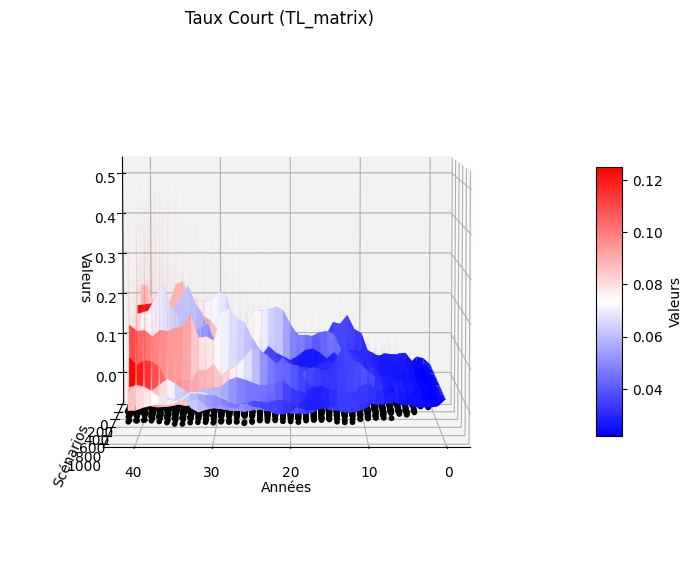

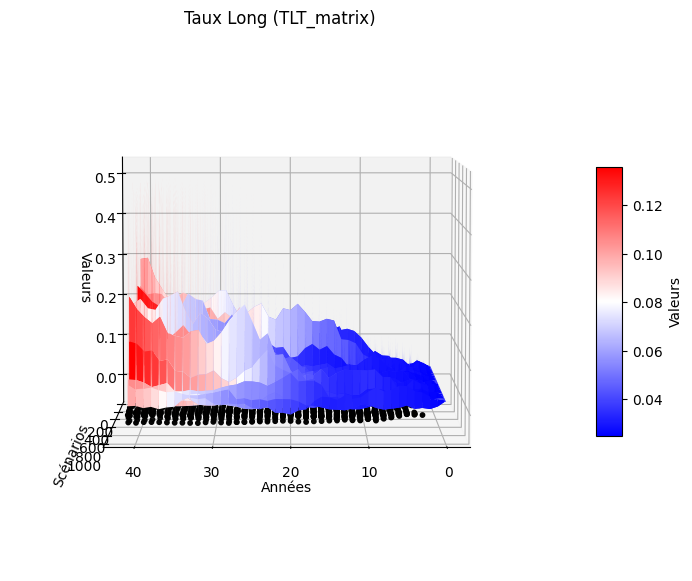

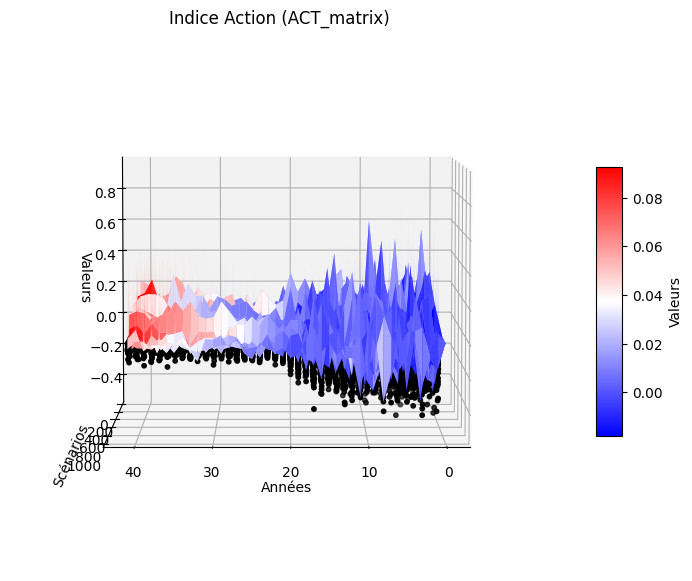

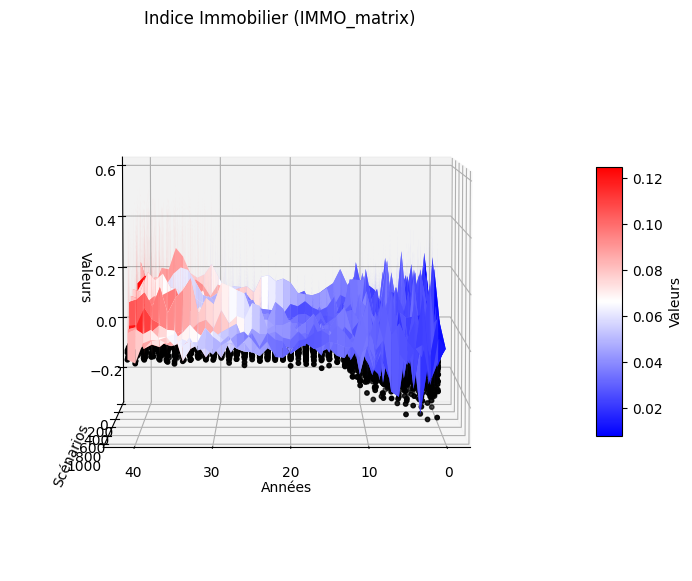

In [ ]:
plot_matrix_3d(TL_matrix, title="Taux Court (TL_matrix)")
plot_matrix_3d(TLT_matrix, title="Taux Long (TLT_matrix)")
plot_matrix_3d(ACT_matrix, title="Indice Action (ACT_matrix)")
plot_matrix_3d(IMMO_matrix, title="Indice Immobilier (IMMO_matrix)")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap

def plot_matrix_interval(matrix, title="Visualisation 3D", start_year=0, end_year=None, elev=15, azim=120):
    """
    Trace un plot 3D pour une matrice (scénarios × années).
    - matrix : numpy array (n_scenarios × n_years)
    - title  : titre du graphique
    - start_year : année de début (index colonne)
    - end_year   : année de fin (index colonne, exclusif)
    - elev, azim : angles de vue pour la caméra
    """
    n_scenarios, n_years = matrix.shape

    # Si end_year n'est pas précisé, on prend jusqu'à la dernière année
    if end_year is None or end_year > n_years:
        end_year = n_years

    # Sélectionner l'intervalle d'années
    matrix_interval = matrix[:, start_year:end_year]
    years_interval = np.arange(start_year, end_year)
    scenarios = np.arange(n_scenarios)

    # Créer les axes
    X, Y = np.meshgrid(years_interval, scenarios)
    Z = matrix_interval

    # Colormap personnalisée
    colors = ["blue", "white", "red"]
    custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

    # Plot 3D
    fig = plt.figure(figsize=(12,7))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(X, Y, Z, cmap=custom_cmap, edgecolor='none', alpha=0.6)

    # Points négatifs en scatter pour les mettre en évidence
    neg_idx = Z < 0
    ax.scatter(X[neg_idx], Y[neg_idx], Z[neg_idx],
               color='black', s=10, label='Valeurs négatives (highlight)')

    # Angle de vue
    ax.view_init(elev=elev, azim=azim)

    # Titres et labels
    ax.set_title(title + f" (années {start_year} à {end_year-1})")
    ax.set_xlabel("Années")
    ax.set_ylabel("Scénarios")
    ax.set_zlabel("Valeurs")
    fig.colorbar(surf, shrink=0.5, aspect=10, label="Valeurs")
    ax.legend()

    plt.show()

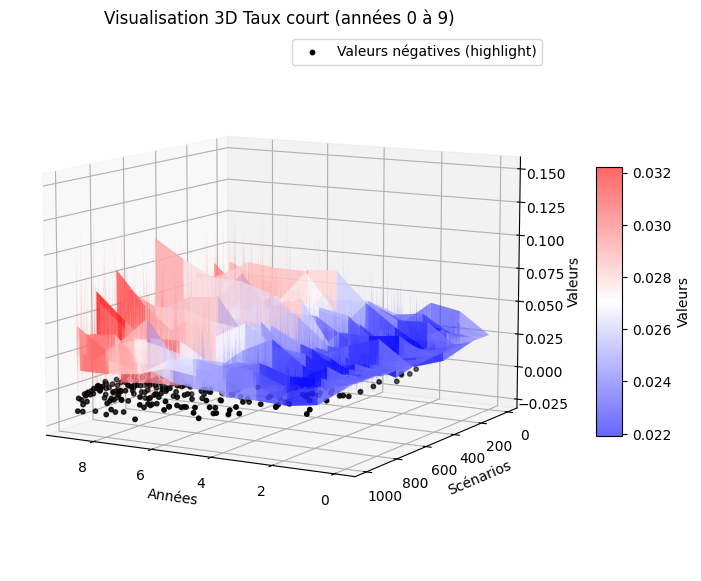

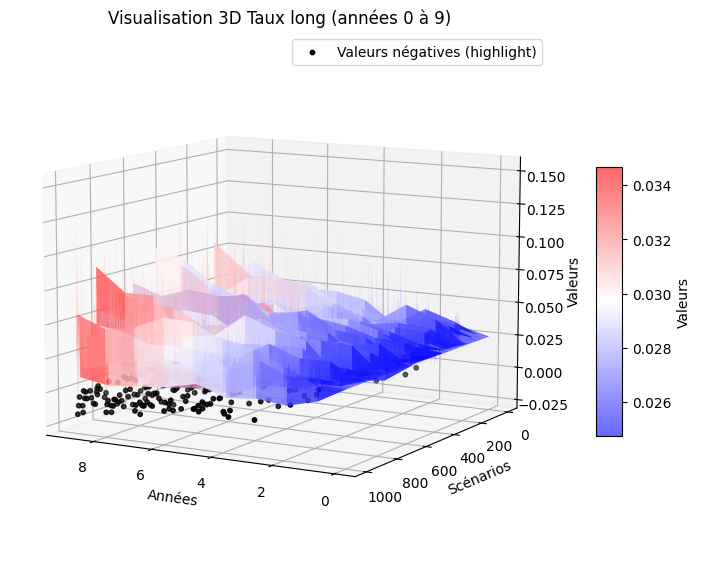

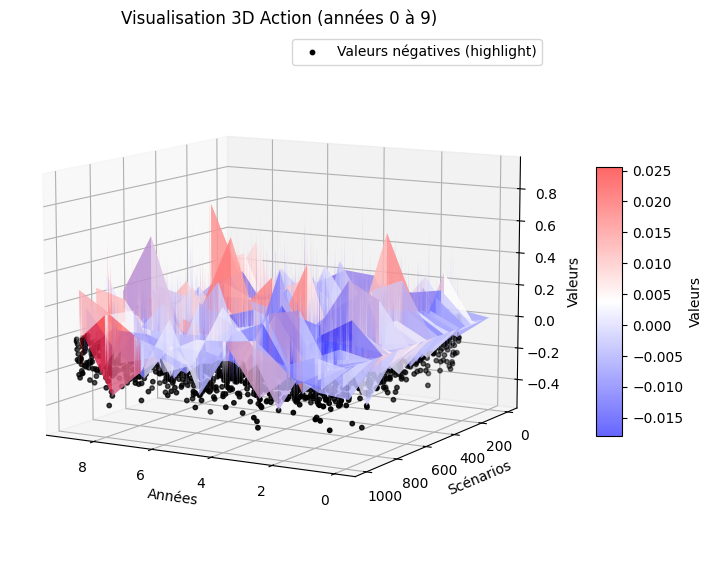

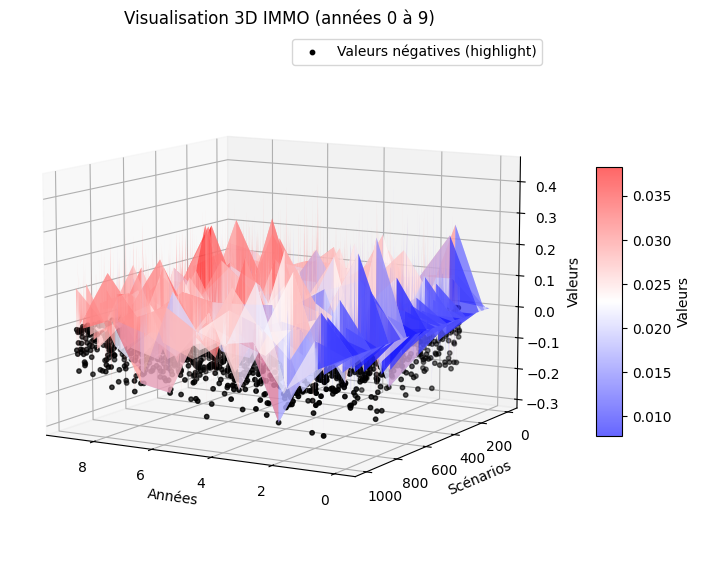

In [ ]:
plot_matrix_interval(TL_matrix, title="Visualisation 3D Taux court", start_year=0, end_year=10, elev=10, azim=120)
plot_matrix_interval(TLT_matrix, title="Visualisation 3D Taux long", start_year=0, end_year=10, elev=10, azim=120)
plot_matrix_interval(ACT_matrix, title="Visualisation 3D Action", start_year=0, end_year=10, elev=10, azim=120)
plot_matrix_interval(IMMO_matrix, title="Visualisation 3D IMMO", start_year=0, end_year=10, elev=10, azim=120)

Paramètre clustering, (2,5), (70,76), (44,47), étude de la cohérence des output be_df, pvfp_df

In [ ]:
def check_output_clustering_consistency(be_df, pvfp_df, scenario_groups, k=3):
    """
    Vérifie si les groupes de scénarios sont dans le même cluster pour BE et PVFP.

    Parameters:
    - be_df : DataFrame avec colonne "BE"
    - pvfp_df : DataFrame avec colonne "PVFP"
    - scenario_groups : liste de tuples, ex. [(2,5), (70,76), (44,47)]
    - k : nombre de clusters

    Returns:
    - Résumé affiché à l'écran
    """
    from sklearn.cluster import KMeans

    # Clustering BE
    be_values = be_df["BE"].values.reshape(-1, 1)
    be_labels = KMeans(n_clusters=k, random_state=42).fit_predict(be_values)

    # Clustering PVFP
    pvfp_values = pvfp_df["PVFP"].values.reshape(-1, 1)
    pvfp_labels = KMeans(n_clusters=k, random_state=42).fit_predict(pvfp_values)

    print(f"\n🔍 Vérification de cohérence des groupes dans les clusters BE et PVFP (k={k})\n")

    for group in scenario_groups:
        i, j = group
        same_be = be_labels[i] == be_labels[j]
        same_pvfp = pvfp_labels[i] == pvfp_labels[j]

        print(f"Groupe ({i}, {j}) :")
        print(f"  ➤ BE : Cluster {be_labels[i]} vs {be_labels[j]} → {'✅ même cluster' if same_be else '❌ clusters différents'}")
        print(f"  ➤ PVFP : Cluster {pvfp_labels[i]} vs {pvfp_labels[j]} → {'✅ même cluster' if same_pvfp else '❌ clusters différents'}")
        print("")

    return

In [ ]:
scenario_groups = [(2, 5), (70, 76), (44, 47),(12,15),(339,363),(133,191)]
check_output_clustering_consistency(be_df, pvfp_df, scenario_groups, k=3)


🔍 Vérification de cohérence des groupes dans les clusters BE et PVFP (k=3)

Groupe (2, 5) :
  ➤ BE : Cluster 0 vs 1 → ❌ clusters différents
  ➤ PVFP : Cluster 2 vs 2 → ✅ même cluster

Groupe (70, 76) :
  ➤ BE : Cluster 1 vs 1 → ✅ même cluster
  ➤ PVFP : Cluster 0 vs 0 → ✅ même cluster

Groupe (44, 47) :
  ➤ BE : Cluster 0 vs 0 → ✅ même cluster
  ➤ PVFP : Cluster 0 vs 0 → ✅ même cluster

Groupe (12, 15) :
  ➤ BE : Cluster 2 vs 0 → ❌ clusters différents
  ➤ PVFP : Cluster 2 vs 2 → ✅ même cluster

Groupe (339, 363) :
  ➤ BE : Cluster 1 vs 1 → ✅ même cluster
  ➤ PVFP : Cluster 2 vs 2 → ✅ même cluster

Groupe (133, 191) :
  ➤ BE : Cluster 1 vs 1 → ✅ même cluster
  ➤ PVFP : Cluster 0 vs 1 → ❌ clusters différents



Pourcentage de clustering d'output PVFP vs clustering d'input

In [ ]:
def evaluate_cluster_consistency(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,
                                 be_df, pvfp_df, k=3):
    """
    Vérifie si les scénarios qui sont dans le même cluster pour les 4 inputs
    sont aussi dans le même cluster pour les outputs BE et PVFP.

    Parameters:
    - TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix : np.ndarray
    - be_df, pvfp_df : DataFrames avec colonnes "BE" et "PVFP"
    - k : nombre de clusters

    Returns:
    - Pourcentage de cohérence
    """
    from sklearn.cluster import KMeans
    import numpy as np

    # Clustering des inputs
    labels_TL = KMeans(n_clusters=k, random_state=42).fit_predict(TL_matrix)
    labels_TLT = KMeans(n_clusters=k, random_state=42).fit_predict(TLT_matrix)
    labels_ACT = KMeans(n_clusters=k, random_state=42).fit_predict(ACT_matrix)
    labels_IMMO = KMeans(n_clusters=k, random_state=42).fit_predict(IMMO_matrix)

    # Clustering des outputs
    labels_BE = KMeans(n_clusters=k, random_state=42).fit_predict(be_df["BE"].values.reshape(-1, 1))
    labels_PVFP = KMeans(n_clusters=k, random_state=42).fit_predict(pvfp_df["PVFP"].values.reshape(-1, 1))

    n_scenarios = TL_matrix.shape[0]
    matched_count = 0
    total_checked = 0

    for i in range(n_scenarios):
        for j in range(i + 1, n_scenarios):
            # Vérifier si i et j sont dans le même cluster pour les 4 inputs
            if (labels_TL[i] == labels_TL[j] and
                labels_TLT[i] == labels_TLT[j] and
                labels_ACT[i] == labels_ACT[j] and
                labels_IMMO[i] == labels_IMMO[j]):

                total_checked += 1
                # Vérifier si i et j sont aussi dans le même cluster pour les outputs
                if labels_BE[i] == labels_BE[j] and labels_PVFP[i] == labels_PVFP[j]:
                    matched_count += 1

    if total_checked == 0:
        print("⚠️ Aucun groupe commun trouvé dans les 4 clusters d'entrée.")
        return 0.0

    pourcentage = (matched_count / total_checked) * 100
    print(f"\n✅ {matched_count} sur {total_checked} groupes d'entrée cohérents ont aussi des sorties cohérentes.")
    print(f"📊 Pourcentage de cohérence : {pourcentage:.2f}%\n")

    return pourcentage

In [ ]:
evaluate_cluster_consistency(TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix,be_df, pvfp_df, k=3)


✅ 32584 sur 144608 groupes d'entrée cohérents ont aussi des sorties cohérentes.
📊 Pourcentage de cohérence : 22.53%



22.532639964593937

# Section 4 - Marchine learing regression surpervisée BE / PVFP


Préparation des données

In [ ]:
# Chaque matrice : shape (1000, 42)
# On concatène les 4 matrices en une seule matrice X
X = np.hstack([TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix])  # shape (1000, 168)

# Cibles
y_be = be_df["BE"].values  # shape (1000,)
y_pvfp = pvfp_df["PVFP"].values  # shape (1000,)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:

# 🔄 Normalisation par scénario (ligne par ligne)
X_scaled = np.zeros_like(X)
for i in range(X.shape[0]):
    scaler = StandardScaler()
    X_scaled[i, :] = scaler.fit_transform(X[i, :].reshape(-1, 1)).flatten()


Regression multivariée

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split   # divesion des données en ensemble d'entraînement et de test
from sklearn.metrics import mean_squared_error, r2_score  # erreur quadratique moyenne, coeff de determination

# Split 20% de données pour le test, 80% de données pour le train
X_be_train, X_be_test, y_be_train, y_be_test = train_test_split(X_scaled, y_be, test_size=0.2, random_state=42)
X_pvfp_train, X_pvfp_test, y_pvfp_train, y_pvfp_test = train_test_split(X_scaled, y_pvfp, test_size=0.2, random_state=42)

# Modèle Random forest pour prédire BE : 100 arbres
model_be = RandomForestRegressor(n_estimators=100, random_state=42)
model_be.fit(X_be_train, y_be_train)

model_pvfp = RandomForestRegressor(n_estimators=100, random_state=42)
model_pvfp.fit(X_pvfp_train, y_pvfp_train)

# Prédiction BE sur les données de test
y_be_pred = model_be.predict(X_be_test)
y_pvfp_pred = model_pvfp.predict(X_pvfp_test)

# Évaluation
from math import sqrt
print("BE - RMSE :", sqrt(mean_squared_error(y_be_test, y_be_pred)))
print("BE - R² :", r2_score(y_be_test, y_be_pred))

print("pvfp - RMSE :", sqrt(mean_squared_error(y_pvfp_test, y_pvfp_pred)))
print("pvfp - R² :", r2_score(y_pvfp_test, y_pvfp_pred))

In [ ]:
def generate_feature_names():
    labels = ["TL", "TLT", "ACT", "IMMO"]
    feature_names = []
    for label in labels:
        for i in range(1, 43):  # années 1 à 42
            feature_names.append(f"{label}_{i}")
    return feature_names

In [ ]:
def plot_feature_importance_named(importances, title="Importance des variables", step=1):
    feature_names = generate_feature_names()
    x = np.arange(len(importances))

    plt.figure(figsize=(22, 6))  # ✅ élargir la figure
    plt.plot(x, importances, marker='o', linestyle='-', alpha=0.7)
    plt.title(title, fontsize=16)
    plt.xlabel("Paramètre & Année", fontsize=12)
    plt.ylabel("Importance", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)

    # ✅ afficher plus de labels en réduisant le pas
    plt.xticks(x[::step], feature_names[::step], rotation=90, fontsize=8)

    plt.tight_layout()
    plt.show()

In [ ]:
importances_be = model_be.feature_importances_
plot_feature_importance_named(importances_be, title="Importance des variables pour BE")

importances_pvfp = model_pvfp.feature_importances_
plot_feature_importance_named(importances_pvfp, title="Importance des variables pour BE")

In [ ]:
pip install xgboost

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
from math import sqrt
import numpy as np

def test_models(X, y, target_name="BE"):
    """
    Teste plusieurs modèles de régression et compare leurs performances.

    Parameters:
    - X : matrice des features (shape: n_samples, n_features)
    - y : vecteur cible (shape: n_samples,)
    - target_name : nom de la cible ("BE" ou "PVFP")
    """
    # Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Liste des modèles
    models = {
        "LinearRegression": LinearRegression(),
        "GradientBoosting": GradientBoostingRegressor(random_state=42),
        "XGBoost": XGBRegressor(random_state=42),
        "MLPRegressor": MLPRegressor(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
    }

    print(f"\n📊 Évaluation des modèles pour la cible : {target_name}\n")

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        rmse = sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)
        print(f"🔹 {name} → RMSE: {rmse:.4f} | R²: {r2:.4f}")

In [ ]:
# X = np.hstack([TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix])
# X_scaled = StandardScaler().fit_transform(X)

test_models(X_scaled, y_be, target_name="BE")
test_models(X_scaled, y_pvfp, target_name="PVFP")

In [ ]:
pip install shap

In [ ]:
import shap

# Entraîner le modèle
model = XGBRegressor(random_state=42)
model.fit(X_be_train, y_be_train)

# Créer l'explainer SHAP
explainer = shap.Explainer(model, X_be_train)
shap_values = explainer(X_be_test)

# Visualisation globale
shap.plots.beeswarm(shap_values, max_display=20)

# Visualisation pour un scénario spécifique
shap.plots.waterfall(shap_values[0])

# Section 4.2 PVFP Gradientboosting

- Entraînement du modèle
- Évaluation des performances
- Importance des variables
- Visualisation des prédictions
- Interprétation avec SHAP


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
import matplotlib.pyplot as plt
import shap
import numpy as np

def study_PVFP(X_scaled, y_pvfp):
    print("\n🔸 Étude approfondie pour PVFP (Gradient Boosting)\n")

    # 1. Split des données
    X_pvfp_train, X_pvfp_test, y_pvfp_train, y_pvfp_test = train_test_split(X_scaled, y_pvfp, test_size=0.2, random_state=42)

    # 2. Entraînement du modèle
    model = GradientBoostingRegressor(random_state=42)
    model.fit(X_pvfp_train, y_pvfp_train)
    y_pvfp_pred = model.predict(X_pvfp_test)

    # 3. Évaluation
    rmse = sqrt(mean_squared_error(y_pvfp_test, y_pvfp_pred))
    r2 = r2_score(y_pvfp_test, y_pvfp_pred)
    print(f"✅ RMSE : {rmse:.4f}")
    print(f"✅ R² : {r2:.4f}")

    # 4. Importance des variables (triées et filtrées)
    importances = model.feature_importances_
    feature_names = [f"{label}_{i}" for label in ["TL", "TLT", "ACT", "IMMO"] for i in range(1, 43)]

    # Filtrer les importances non nulles
    non_zero_indices = np.where(importances > 0)[0]
    filtered_importances = importances[non_zero_indices]
    filtered_names = [feature_names[i] for i in non_zero_indices]

    # Trier par ordre décroissant
    sorted_indices = np.argsort(filtered_importances)[::-1]
    sorted_importances = filtered_importances[sorted_indices]
    sorted_names = [filtered_names[i] for i in sorted_indices]

     # Tracer avec annotations
    plt.figure(figsize=(10, max(6, len(sorted_names) * 0.3)))
    bars = plt.barh(sorted_names, sorted_importances, color='skyblue')
    plt.gca().invert_yaxis()
    plt.title("📈 Importance des variables (PVFP - Gradient Boosting)", fontsize=16)
    plt.xlabel("Importance", fontsize=12)
    plt.ylabel("Paramètre + N° variable", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)

     # Ajouter les valeurs sur les barres
    for bar in bars:
      width = bar.get_width()
      plt.text(width + 0.001, bar.get_y() + bar.get_height()/2,
             f"{width:.4f}", va='center', fontsize=10, color='black')

    plt.tight_layout()
    plt.show()

    # 5. Visualisation des prédictions
    plt.figure(figsize=(6, 4))
    plt.scatter(y_pvfp_test, y_pvfp_pred, alpha=0.6)
    plt.plot([min(y_pvfp_test), max(y_pvfp_test)], [min(y_pvfp_test), max(y_pvfp_test)], color='red', linestyle='--')
    plt.title("🔍 PVFP réel vs PVFP prédit", fontsize=14)
    plt.xlabel("PVFP réel", fontsize=12)
    plt.ylabel("PVFP prédit", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

    # 6. SHAP values
    feature_names = [f"{label}_{i}" for label in ["TL", "TLT", "ACT", "IMMO"] for i in range(1, 43)]
    explainer = shap.Explainer(model, X_pvfp_train, feature_names=feature_names)
    shap_values = explainer(X_pvfp_test)
    shap.plots.beeswarm(shap_values, max_display=20)

    return model

In [ ]:
model_pvfp = study_PVFP(X_scaled, y_pvfp)

In [ ]:
# 7. SHAP waterfall plot pour un scénario spécifique
scenario_index = 2  # tu peux changer ce numéro pour explorer d'autres scénarios

# Exemple de construction des noms de variables
feature_names = []

for prefix, matrix in zip(["TL", "TLT", "ACT", "IMMO"], [TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix]):
    for i in range(matrix.shape[1]):
        feature_names.append(f"{prefix}_{i}")
shap_values.feature_names = feature_names

print(f"\n🔍 Décomposition SHAP pour le scénario {scenario_index} :")
shap.plots.waterfall(shap_values[scenario_index], max_display=20)

In [ ]:
# feature_names déjà définis
feature_names = [f"{prefix}_{i}" for prefix, matrix in zip(["TL", "TLT", "ACT", "IMMO"], [TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix]) for i in range(matrix.shape[1])]

# Recalculer les SHAP values avec noms explicites
explainer = shap.Explainer(model, X_pvfp_train, feature_names=feature_names)
shap_values = explainer(X_pvfp_test)

# Exemple : stocker les top variables pour chaque scénario
top_shap_by_scenario = []

for i in range(len(X_pvfp_test)):
    values = shap_values[i].values
    abs_values = np.abs(values)
    top_indices = np.argsort(abs_values)[::-1][:5]  # top 5 variables
    top_features = [feature_names[j] for j in top_indices]
    top_contributions = values[top_indices]
    top_shap_by_scenario.append(list(zip(top_features, top_contributions)))

# Affichage exemple pour les 3 premiers scénarios
for i in range(6):
    print(f"\n🔍 Scénario {i} – Top 5 variables SHAP :")
    for name, val in top_shap_by_scenario[i]:
        print(f"  {name}: {val:.4f}")

In [ ]:
for i in range(3):  # ou range(len(X_test)) pour tous
    print(f"\n🔍 Waterfall SHAP – Scénario {i}")
    shap.plots.waterfall(shap_values[i], max_display=20)

In [ ]:
# Définir les noms de variables
feature_names = [f"{prefix}_Year{i+1}" for prefix, matrix in zip(["TL", "TLT", "ACT", "IMMO"], [TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix]) for i in range(matrix.shape[1])]

# Recalculer les SHAP values avec noms
explainer = shap.Explainer(model, X_pvfp_train, feature_names=feature_names)
shap_values = explainer(X_pvfp_test)


In [ ]:

# Extraire les valeurs SHAP dans un DataFrame
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# Ajouter la prédiction du modèle et la vraie valeur
shap_df["PVFP_prédit"] = model.predict(X_pvfp_test)
shap_df["PVFP_réel"] = pd.Series(y_pvfp_test)


In [ ]:
# Sauvegarder dans l'environnement Colab
shap_df.to_excel("shap_contributions_PVFP.xlsx", index=False)

# Télécharger le fichier
from google.colab import files
files.download("shap_contributions_PVFP.xlsx")

# Section 5 - étude année par année


In [88]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

def cluster_data(X, Y, k_x=3, k_y=3):

    # S'assurer que Y est en colonne
    Y = Y.reshape(-1, 1)

    # Clustering sur X
    kmeans_x = KMeans(n_clusters=k_x, random_state=42)
    clusters_x = kmeans_x.fit_predict(X)

    # Clustering sur Y
    kmeans_y = KMeans(n_clusters=k_y, random_state=42)
    clusters_y = kmeans_y.fit_predict(Y)

    # Affichage rapide
    print(f"Clusters X (hypo) :", np.unique(clusters_x))
    print(f"Clusters Y (RFA) :", np.unique(clusters_y))

    # Visualisation des clusters X (2 premières dimensions)
    plt.scatter(X[:,0], X[:,1], c=clusters_x, cmap="viridis", alpha=0.7)
    plt.xlabel("Paramètre 1")
    plt.ylabel("Paramètre 2")
    plt.title("Clustering X (hypothèses)")
    plt.show()

    # Visualisation des clusters Y
    plt.scatter(range(len(Y)), Y, c=clusters_y, cmap="plasma", alpha=0.7)
    plt.xlabel("Scénarios")
    plt.ylabel("RFA")
    plt.title("Clustering Y (RFA)")
    plt.show()

    return clusters_x, clusters_y

Clusters X (hypo) : [0 1 2]
Clusters Y (RFA) : [0 1 2]


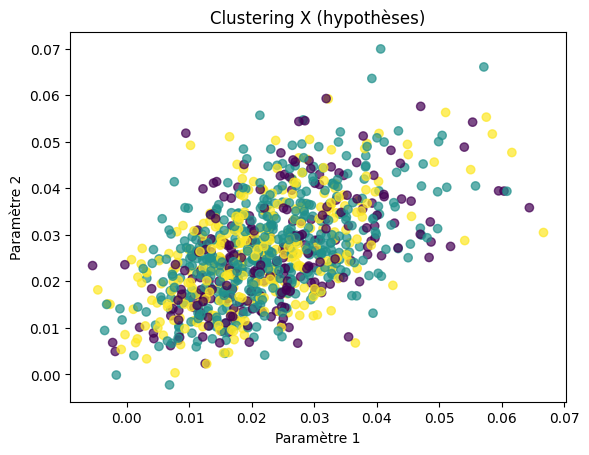

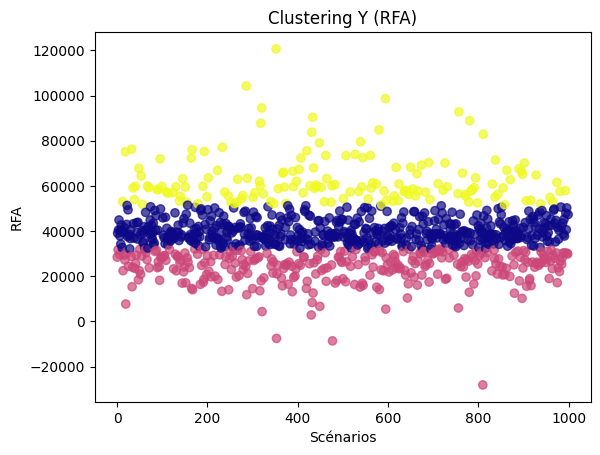

In [89]:
# Supposons que tu as déjà construit X et y pour une année donnée
# X.shape = (1000, 4), y.shape = (1000,)

clusters_x, clusters_y = cluster_data(hypo, RFA, k_x=3, k_y=3)

In [90]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import numpy as np

def hierarchical_cluster_data(X, Y, k_x=3, k_y=3, linkage="ward"):

    # S'assurer que Y est en colonne
    Y = Y.reshape(-1, 1)

    # Clustering hiérarchique sur X
    hc_x = AgglomerativeClustering(n_clusters=k_x, linkage=linkage)
    clusters_x = hc_x.fit_predict(X)

    # Clustering hiérarchique sur Y
    hc_y = AgglomerativeClustering(n_clusters=k_y, linkage=linkage)
    clusters_y = hc_y.fit_predict(Y)

    # Affichage rapide
    print(f"Clusters X (hypo) :", np.unique(clusters_x))
    print(f"Clusters Y (RFA) :", np.unique(clusters_y))

    # Visualisation des clusters X (2 premières dimensions)
    plt.scatter(X[:,0], X[:,1], c=clusters_x, cmap="viridis", alpha=0.7)
    plt.xlabel("Paramètre 1")
    plt.ylabel("Paramètre 2")
    plt.title("Clustering hiérarchique X (hypothèses)")
    plt.show()

    # Visualisation des clusters Y
    plt.scatter(range(len(Y)), Y, c=clusters_y, cmap="plasma", alpha=0.7)
    plt.xlabel("Scénarios")
    plt.ylabel("RFA")
    plt.title("Clustering hiérarchique Y (RFA)")
    plt.show()

    return clusters_x, clusters_y

Clusters X (hypo) : [0 1 2]
Clusters Y (RFA) : [0 1 2]


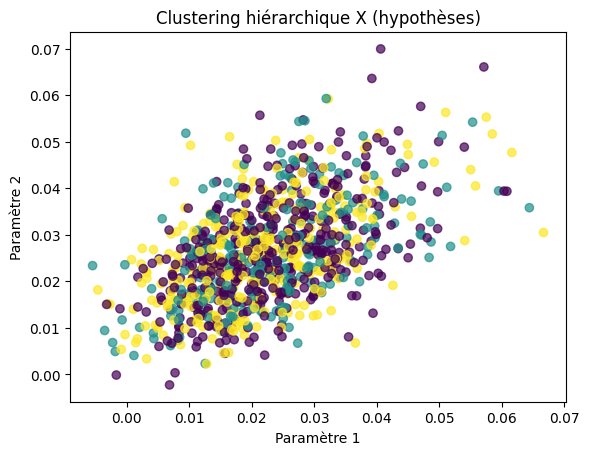

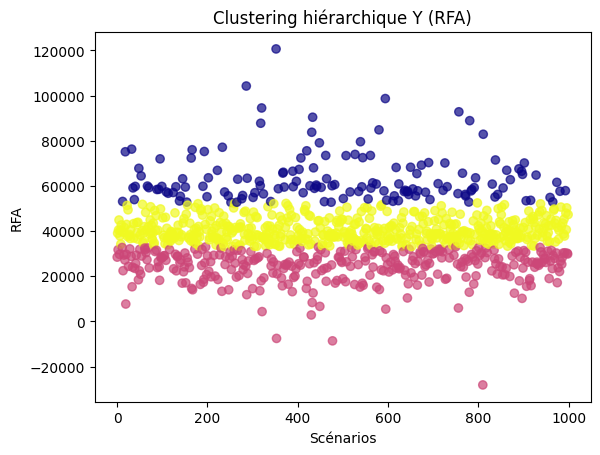

In [91]:
# Supposons que tu as déjà construit X et y pour une année donnée
clusters_x, clusters_y = hierarchical_cluster_data(hypo, RFA, k_x=3, k_y=3, linkage="ward")

search for the best regression approach

In [98]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR

def regression_study(X, y, test_size=0.2, random_state=42):

    # Séparer train/test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Liste des modèles à tester
    models = {
        "LinearRegression": LinearRegression(),
        "Ridge": Ridge(alpha=1.0),
        "Lasso": Lasso(alpha=0.01),
        "RandomForest": RandomForestRegressor(n_estimators=200, random_state=random_state),
        "GradientBoosting": GradientBoostingRegressor(n_estimators=200, random_state=random_state),
        "SVR": SVR(kernel="rbf")
    }

    results = {}

    # Entraînement et évaluation
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        results[name] = r2
        print(f"{name} → R2 = {r2:.4f}")

    # Trouver le meilleur modèle
    best_model = max(results, key=results.get)
    print("\n✅ Meilleur modèle :", best_model, "avec R2 =", results[best_model])

    return results, best_model

In [99]:
# Supposons que tu as déjà X et y pour une année donnée
results, best_model = regression_study(hypo, RFA)

# Résultats sous forme de DataFrame pour plus de lisibilité
df_results = pd.DataFrame(list(results.items()), columns=["Modèle", "R2"])
print(df_results)

LinearRegression → R2 = 0.6024
Ridge → R2 = 0.5221
Lasso → R2 = 0.6024
RandomForest → R2 = 0.5590
GradientBoosting → R2 = 0.5546
SVR → R2 = -0.0087

✅ Meilleur modèle : Lasso avec R2 = 0.6023942537688325
             Modèle        R2
0  LinearRegression  0.602385
1             Ridge  0.522128
2             Lasso  0.602394
3      RandomForest  0.558966
4  GradientBoosting  0.554588
5               SVR -0.008714


In [100]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import shap

def gradient_boosting_with_shap(X, y, test_size=0.2, random_state=42,
                                n_estimators=300, learning_rate=0.05, max_depth=3,
                                feature_names=None):

    # Séparer train/test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Définir le modèle Gradient Boosting
    model = GradientBoostingRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        random_state=random_state
    )

    # Entraînement
    model.fit(X_train, y_train)

    # Prédictions
    y_pred = model.predict(X_test)

    # Évaluation
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    print(f"Gradient Boosting → R2 = {r2:.4f}, MSE = {mse:.4f}")

    # Visualisation : prédictions vs valeurs réelles
    plt.scatter(y_test, y_pred, alpha=0.7, color="blue")
    plt.xlabel("Valeurs réelles (y_test)")
    plt.ylabel("Prédictions (y_pred)")
    plt.title("Gradient Boosting : Réel vs Prédit")
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--")
    plt.show()

    # --- Analyse SHAP ---
    explainer = shap.Explainer(model, X_train)
    shap_values = explainer(X_test)

    # Summary plot (importance globale des features)
    shap.summary_plot(shap_values, X_test, feature_names=feature_names)

    # Optionnel : dépendance d’une feature
    if feature_names:
        shap.dependence_plot(0, shap_values.values, X_test, feature_names=feature_names)

    return model, r2, mse

Gradient Boosting → R2 = 0.5636, MSE = 259605681.4609


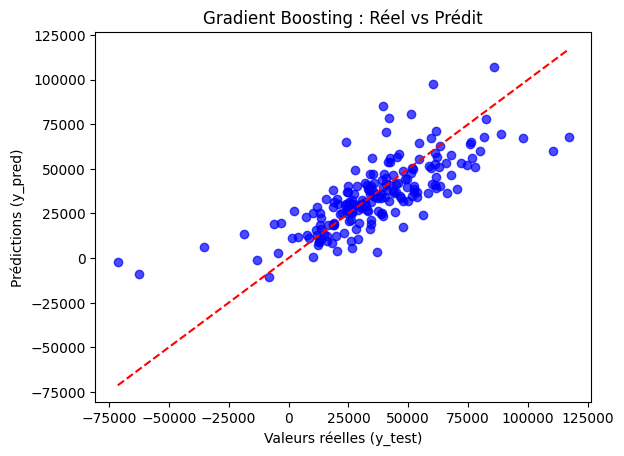

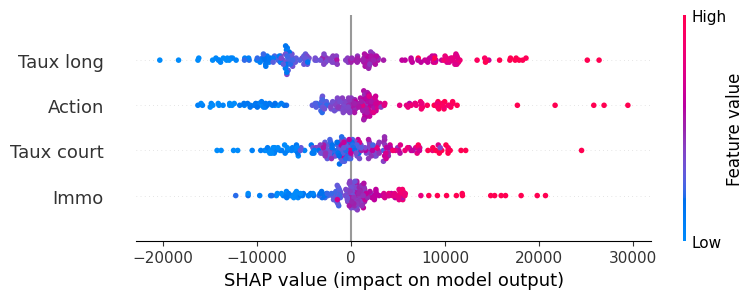

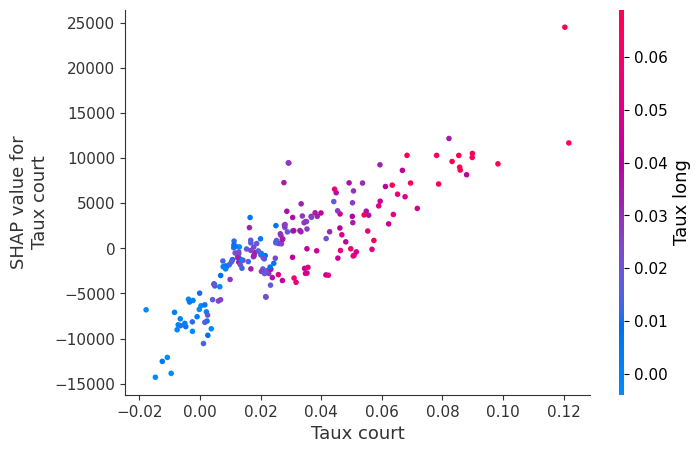

In [101]:
# Supposons que X et y soient déjà définis
feature_names = ["Taux court", "Taux long", "Action", "Immo"]

model, r2, mse = gradient_boosting_with_shap(hypo, RFA, feature_names=feature_names)

In [97]:
all_results = []

# Boucle sur les années 0 à 9 inclus
for year in range(0, 10):
    print(f"\n===== Année {year} =====")

    # Préparer X (hypo) et y (RFA) pour l'année donnée
    hypo, RFA = prepare_year_data(year, TL_matrix, TLT_matrix, ACT_matrix, IMMO_matrix, RFA_matrix)

    # Étude de régression avec comparaison des approches
    results, best_model = regression_study(hypo, RFA)

    # Stocker les résultats
    all_results.append({
        "Année": year,
        "BestModel": best_model,
        "Scores": results
    })

# Transformer en DataFrame lisible
df_summary = pd.DataFrame([
    {"Année": r["Année"], "BestModel": r["BestModel"], **r["Scores"]}
    for r in all_results
])

print("\nRésumé des meilleurs modèles par année :")
print(df_summary)


===== Année 0 =====
LinearRegression → R2 = 0.5312
Ridge → R2 = 0.5032
Lasso → R2 = 0.5312
RandomForest → R2 = 0.8577
GradientBoosting → R2 = 0.8792
SVR → R2 = -0.0392

✅ Meilleur modèle : GradientBoosting avec R2 = 0.8792329408690586

===== Année 1 =====
LinearRegression → R2 = 0.2752
Ridge → R2 = 0.2673
Lasso → R2 = 0.2752
RandomForest → R2 = 0.1920
GradientBoosting → R2 = 0.1877
SVR → R2 = 0.0031

✅ Meilleur modèle : Lasso avec R2 = 0.275172014178512

===== Année 2 =====
LinearRegression → R2 = 0.3334
Ridge → R2 = 0.3197
Lasso → R2 = 0.3334
RandomForest → R2 = 0.1593
GradientBoosting → R2 = 0.0927
SVR → R2 = 0.0045

✅ Meilleur modèle : Lasso avec R2 = 0.33340686331546254

===== Année 3 =====
LinearRegression → R2 = 0.3880
Ridge → R2 = 0.3434
Lasso → R2 = 0.3880
RandomForest → R2 = 0.2538
GradientBoosting → R2 = 0.1993
SVR → R2 = -0.0012

✅ Meilleur modèle : LinearRegression avec R2 = 0.38802030146351196

===== Année 4 =====
LinearRegression → R2 = 0.5181
Ridge → R2 = 0.4926
Lasso →

# Nouvelle section